In [17]:
# Libraries

# Data Manipulation & Visualisation
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import missingno as msn

# Normality Test (must be 3/4 tests Passed Minimum)
from scipy.stats import kstest, shapiro, normaltest
from statsmodels.stats.diagnostic import lilliefors

# NEW
from matplotlib.colors import ListedColormap
import matplotlib.image as mpimg
from sklearn.ensemble import VotingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost.sklearn import XGBClassifier
from pandas.plotting import scatter_matrix

# ML
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, RandomizedSearchCV
# Classification
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score, recall_score, precision_score, RocCurveDisplay, mean_absolute_percentage_error, PrecisionRecallDisplay
# Regression
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, silhouette_score
from sklearn.metrics._scorer import _SCORERS
from statsmodels.stats.outliers_influence import variance_inflation_factor
# KNN & Decision tree
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, plot_tree
# MinMax Scaler (Normalisation)
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, OneHotEncoder, LabelEncoder, KBinsDiscretizer, PolynomialFeatures
from sklearn.compose import ColumnTransformer
# Pipeline
from sklearn.pipeline import Pipeline
from imblearn.pipeline import pipeline
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss
# Linear Model
from sklearn.linear_model import LogisticRegression, LinearRegression, Lasso, Ridge
# Imputation
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer, KNNImputer
# Imbalance Calssification
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss

# Category
import category_encoders as ce
from category_encoders import BinaryEncoder

# Model Saving
import joblib
import pickle

#import google cloud library
# import os
# from google.cloud import bigquery
# from google.cloud import storage
# from google.cloud import aiplatform
# from support_functions import missing_value, fill_missing, list_dtypes

# from surprise import Reader
# from surprise import Dataset

# import re
# from string import punctuation
# import nltk
# from nltk.corpus import stopwords
# from nltk.stem import SnowballStemmer
# from nltk.stem import WordNetLemmatizer
# from wordcloud import WordCloud
# from PIL import Image

# from sklearn.datasets import make_blobs
# from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
# from sklearn.decomposition import PCA

# from scipy.spatial.distance import cdist, pdist
# from scipy.cluster.hierarchy import dendrogram, ward, average, complete
# from sklearn.metrics import silhouette_score

# from sklearn.datasets import load_breast_cancer

# Warnings
import warnings
warnings.filterwarnings('ignore')

# Xcode Tools:
# 1. Search: Cmd + F
# 2. showRowNumber: Shift + L 

In [1]:
# Data Manipulation & Visualisation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msn

# Model Saving
import joblib
import pickle

# Warnings
import warnings
warnings.filterwarnings('ignore')

****
# **Table of Contents**
****
1. [1. Business Understanding](#1.-business-understanding)
    - [Context (Background)](#context-background)
    - [Problem Statement](#problem-statement)
    - [Goals & Benefits](#goals-&-benefit)
        - [Project Goals](#project-goals)
        - [General Benefit](#general-benefit)
        - [Project Implementation](#project-mplementation)
    - [Analytical Approach (Models and Evaluation Metrics)](#analytical-approach-models-and-evaluation-metrics)
    - [Limitations](#limitations)
    
2. [2. Data Understanding](#2.-data-understanding)
    - [Load Dataset](#load-dataset)
    - [Numerical, Categorical, and Target Features](#numerical-categorical-and-target-features)
    - [Data Summary](#data-summary)
    - [Statistical Description for Numerical and Categorical Features](#statistical-description-for-numerical-and-categorical-features)
    - [Missing Values](#missing-values)
    - [Data Duplicates](#data-duplicates)
    - [Identify Invalid Data](#identify-invalid-data)
    - [Numerical Features Analysis](#numerical-features-analysis)
        - [Data Distribution](#data-distribution)
        - [Identify Outliers](#identify-outliers)
    - [Categorical Features Analysis](#categorical-features-analysis)
        - [Pivoting](#pivoting)
        
3. [3. Data Preparation](#3.-data-preparation)
    - [Data Cleaning](#data-cleaning)
        - [Handling Missing Values](#handling-missing-values)
        - [Handling Data Duplicates](#handling-data-duplicates)
        - [Handling Invalid Data](#handling-invalid-data)
        - [Handling Outliers](#handling-outliers)
    - [Convert Target Data to Binary Format](#convert-target-data-to-binary-format)
    - [Recheck Missing Values, Data Duplicates, Data Type & Outliers](#recheck-missing-values-data-duplicates-data-type-&-outliers)
    - [Saved Cleaned Data](#save-cleaned-data)

4. [4. Exploratory Data Analysis (EDA)](#4.-exploratory-data-analysis-eda)
    - [Numerical Features Analysis (Post Data Preparation)](#numerical-features-analysis-post-data-preparation)
    - [Categorical Features Analysis (Post Data Preparation)](#categorical-features-analysis-post-data-preparation)
    - [Analysis of Numerical Features Vs Target](#analysis-of-numerical-features-vs-target)
    - [Analysis of Categorical Features Vs Target](#analysis-of-categorical-features-vs-target)

5. [5. Data Preprocessing](#5.-data-preprocessing)
    - [Target Data Proportion](#target-data-proportion)
    - [Feature Engineering](#feature-engineering)
        - [Encoding](#encoding)
        - [Data Splitting](#data-splitting)
        - [Resampling](#resampling)
        - [Scaling](#scaling)
        - [Pipelining](#pipelining)
    - [Feature Selection](#feature-selection)
        
6. [6. Modelling](#6.-modelling)
    - [Linear Models](#linear-models)
    - [Non-Linear Models](#non-linear-models)
        - [Cross Validation of Logistic Regression and KNN with Default Hyperparameters Across Multiple Metrics](#cross-validation-of-logistic-regression-and-knn-with-default-hyperparameters-across-multiple-metrics)
            - [Random Over Sampling (ROS) Without Feature Selection](#random-over-sampling-ros-without-feature-selection)
            - [Random Over Sampling (ROS) With Feature Selection](#random-over-sampling-ros-with-feature-selection)
            - [Random Under Sampling (RUS) Without Feature Selection](#random-under-sampling-rus-without-feature-selection)
            - [Random Under Sampling (RUS) With Feature Selection](#random-under-sampling-rus-with-feature-selection)
            - [Synthetic Minority Over-sampling Technique (SMOTE) Without Feature Selection](#synthetic-minority-over-sampling-technique-smote-without-feature-selection)
            - [Synthetic Minority Over-sampling Technique (SMOTE) With Feature Selection](#synthetic-minority-over-sampling-technique-smote-with-feature-selection)
            - [Near Miss Without Feature Selection](#near-miss-without-feature-selection)
            - [Near Miss With Feature Selection](#near-miss-with-feature-selection)
        - [Cross Validation of Tree-Based Models with Default Hyperparameters Across Multiple Metrics](#cross-validation-of-tree-based-models-with-default-hyperparameters-across-multiple-metrics)
            - [Random Over Sampling (ROS) Without Feature Selection](#random-over-sampling-ros-without-feature-selection-1)
            - [Random Over Sampling (ROS) With Feature Selection](#random-over-sampling-ros-with-feature-selection-1)
            - [Random Under Sampling (RUS) Without Feature Selection](#random-under-sampling-rus-without-feature-selection-1)
            - [Random Under Sampling (RUS) With Feature Selection](#random-under-sampling-rus-with-feature-selection-1)
            - [Synthetic Minority Over-sampling Technique (SMOTE) Without Feature Selection](#synthetic-minority-over-sampling-technique-smote-without-feature-selection-1)
            - [Synthetic Minority Over-sampling Technique (SMOTE) With Feature Selection](#synthetic-minority-over-sampling-technique-smote-with-feature-selection-1)
            - [Near Miss Without Feature Selection](#near-miss-without-feature-selection-1)
            - [Near Miss With Feature Selection](#near-miss-with-feature-selection-1)
        - [Models Performance on Train and Test Set using ... Evaluation Metric and ... Sampling](#models-performance-on-train-and-test-set-using--evaluation-metric-and--sampling)
            - [Logistic Regression and KNN with Default Hyperparameters](#logistic-regression-and-knn-with-default-hyperparameters)
                - [Without Resampling and Feature Selection](#without-resampling-and-without-feature-selection)
                - [Without Resampling and With Feature Selection](#without-resampling-and-with-feature-selection)
                - [With Resampling and Without Feature Selection](#with-resampling-and-without-feature-selection)
                - [With Resampling and Feature Selection](#with-resampling-and-with-feature-selection-1)
            - [Tree-Based Models with Default Hyperparameters](#tree-based-models-with-default-hyperparameters)
                - [Without Resampling and Feature Selection](#without-resampling-and-without-feature-selection-1)
                - [Without Resampling and With Feature Selection](#without-resampling-and-with-feature-selection-1)
                - [With Resampling and Without Feature Selection](#with-resampling-and-without-feature-selection-1)
                - [With Resampling and Feature Selection](#with-resampling-and-with-feature-selection-2)

7. [7. Evaluation](#7.-evaluation)
    - [All Models Performance Comparison](#all-models-performance-comparison)
        - [NO Resampling & NO Selection](#without-resampling-and-without-feature-selection-2)
        - [NO Resampling & WITH Selection](#without-resampling-and-with-feature-selection-2)
        - [WITH Resampling & NO Selection](#with-resampling-and-without-feature-selection-2)
        - [WITH Resampling & WITH Feature Selection](#with-resampling-and-with-feature-selection-3)

8. [8. Hyperparameter Tuning: Best Model Selection](#8.-hyperparameter-tuning-best-model-selection)
    - [Model Before Tuning: Specification of Model](#model-before-tuning--specification-of-model)
    - [Apply 'balanced' Class Weighting for Imbalanced Data](#apply-balanced-class-weighting-for-imbalanced-data)
    - [Hyperparameter Tuning with GridSearchCV](#hyperparameter-tuning-with-gridsearchcv)
    - [Model Performance Comparison (Before and After Tuning)](#model-performance-comparison-before-and-after-tuning)
        - [Before Tuning](#before-tuning)
        - [After Tuning](#after-tuning)
        
9. [9. Final Model Interpretation & Saving](#9.-final-model-interpretation-&-saving)
    - [Final Model](#final-model)
    - [Model Interpretation](#model-interpretation)
        - [Explainable ML](#explainable-ml)
        - [Feature Importance](#feature-importance)
        - [Confusion Matrix](#confusion-matrix)
    - [Save Model](#save-model)

10. [10. Final Model Deployment](#10.-final-model-deployment)
    - [Model Deployment Steps](#model-deployment-steps)

11. [11. Final Model Validation Test on New Data](#11.-final-model-validation-test-on-new-data)
    - [Model Prediction with New Data](#model-prediction-with-new-data)
    - [Model Limitation](#model-limitation)

12. [12. Summary](#12.-summary)
    - [Cost Evaluation](#cost-evaluation)
    - [Conclusion](#conclusion)
    - [Recommendation](#recommendation)

# 1. Business Understanding

## Context (Background)

* **History:** California is a state located on the southwest coast of the United States. Known as "The Golden State", California has a very rich history, geography and culture. Here are some important points regarding California's background:<br>

    **California 1990 :**

    * **Economy:** In 1990, California had a rapidly growing economy, supported by the technology, agriculture, entertainment, and manufacturing sectors. Silicon Valley, in the San Francisco Bay Area, has become a global technology center, and technology companies such as Apple and Microsoft play a large role in economic growth.

    * **Population:** California's population in 1990 had reached more than 29 million residents. As the economy grew, many residents from various states of the United States and abroad moved to California.

    * **Culture:** California continues to promote cultural diversity, arts and entertainment. By 1990, the entertainment industry in Hollywood had long been the center of world film and television production.

    * **Environment:** California in the 1990s faced environmental challenges, including drought and air pollution problems. Conservation and environmental protection efforts are increasingly becoming a major concern.
    
* **Context:** The data contains information from the 1990 California census. So, although it may not help with predicting current housing prices, it does provide an accessible introduction dataset for "1990 California Housing Price" using Machine Learning.
* **Background:** The goal of the "Business Understanding" phase is to comprehend the project objectives and requirements from a business perspective, and then convert this knowledge into a data mining problem definition and a preliminary plan designed to achieve the objectives. California's real estate market is one of the largest and most dynamic in the United States. Factors influencing house prices include location, proximity to amenities, socio-economic factors, and market conditions. Accurate prediction models can provide significant value to stakeholders (Individuals or Groups, or Enterprises) in the real estate industry.
* **Acknowledgement:** This data was initially featured in the following paper: Pace, R. Kelley, and Ronald Barry. "Sparse spatial autoregressions." Statistics & Probability Letters 33.3 (1997): 291-297.

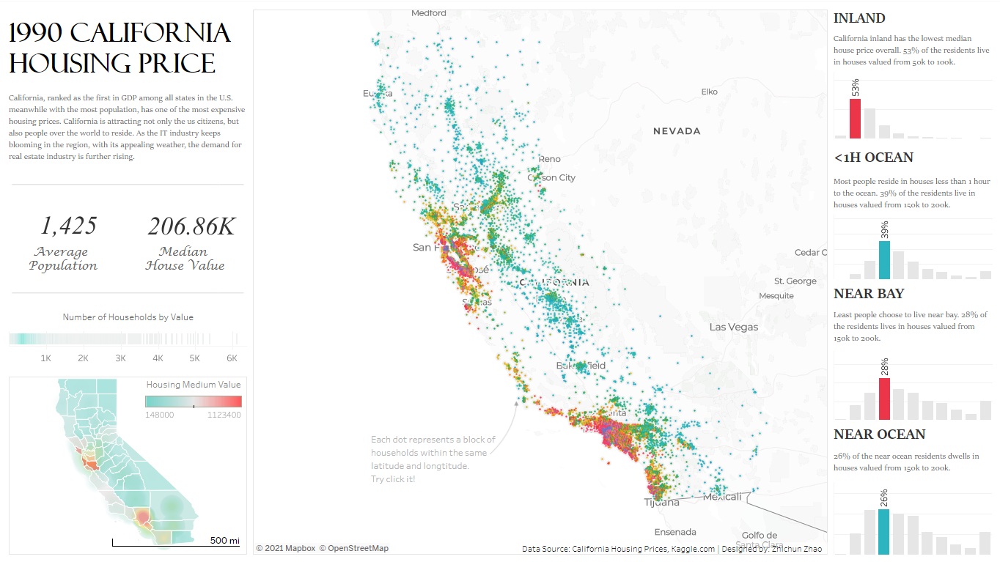

## Problem Statement

* **Problem:** Individuals, Groups, or Enterprises have a harder time predicting House Prices in California for the year 1990. Stakeholders (sellers & buyers) wants to save their time, lower costs, and have transactions with better price-to-value ratio for a fairer and more efficient market
* **Solution:** Create an ML Model that is able to predict House Prices accurately for House prices in California in the 1990s

## Goals

### Project Goals

1. **Macroeconomic Perspective:**
    1. Increasing Economic Market Efficiency through “Price Equilibrium” (balancing supply and demand)
    2. The Potential for more “Transaction Quantity” and “Amount Transacted” -> increasing Gross Domestic Product (i.e. more prosperous)
2. **Seller’s Perspective:** 
    1. Higher “Capital Gain” from optimal pricing 
    2. More “Time saved” by potentially having the property be sold faster (less dormant/idle time)
    3. More “Money saved” by reducing expenses on “Housing price Market Research” due to the research process requiring only an internet access to access the ML Model in discussion instead of the “Manual” way to do market research/surveys
3. **Buyer’s Perspective:**
    1. Better “Property Deals” that suits their respective “Price : Value” ratio perspective 
    2. More “Time saved” by potentially finding a property faster through the “correct” pricing (less research/exploration time)

### General Benefit

1. **Understand Market Trends:** By predicting house prices, we can identify trends of price increases or decreases in specific regions based on the independent and dependent variables present. This information assists both buyers and sellers in making informed decisions.
2. **Financial Planning:** Price predictions enable individuals and families to plan ahead their home purchases wisely. For instance, knowing the estimated future house prices aids in savings and financing planning.
3. **Property Investment:** For investors, predicting house prices helps in selecting potentially profitable properties. Understanding the factors influencing prices allows for smarter and more informed decision-making.
4. **Housing Policies:** Governments and related institutions can use house price predictions to design effective and sustainable housing policies that caters to inclusivity whilst upholding fair and healthy market pricing.

### Project Implementation

1. **Property Market App/Web:** App/Web can connect through our API to access our ML Model and help with predicting the Property Prices Listed on the app/web. Given the Features (independent variables) are common and resembles the market condition.
2. **Property Developer Enterprise:** Enterprises can utilise our API to access our ML Models and help plan their Property Development by knowing the prices in advance, helping them in finding the Optimal Operational Budget for development purposes. Given the Features (independent variables) are common and resembles the market condition.

## Analytical Approach (Models and Evaluation Metrics)

* **Intro:** The analytical approach that we will apply is to carry out data analysis by identify patterns from the available data. We will develop a **Machine Learning using Regression models**. This model will help property owners, both individuals and companies, in determining the optimal selling price for apartments.
* **Models:** Linear and Non-Linear (alternative when performance is still poor) Regression
* **Evaluation Metrics:** The Evaluation Metrics that we are going to utilise are RMSE, MAE dan MAPE. The smaller the metric's value (as it nears to 0), the more accurate the model.
<br>


* **[1] RMSE (Root Mean Square Error)**
RMSE is one of the evaluation metrics commonly used in regression problems to measure the extent of the difference between the predicted values ​​from the model and the actual values ​​from the data. RMSE measures the average of the squared differences between each prediction and the actual value, then takes the square root. This gives an idea of ​​how big the deviation or average error of the model predictions is to the actual value.

The RMSE formula is as follows:
<br>
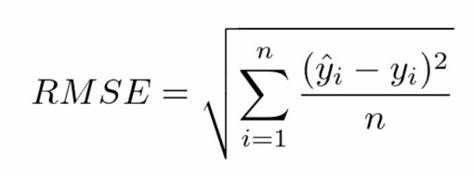
<br>
    - ∑ is sigma (the sum of a sequence or function)<br>
    - ŷi is the predicted value of data i<br>
    - yi is the actual value of data i<br>
    - n is the number of data<br>

* **[2]MAE (Mean Absolute Error)**
MAE is used as an evaluation metric because it has several advantages, especially when used in the context of predicting prices as in this case:
1. Not Sensitive to Outliers: MAE is not very sensitive to outliers, so if there are some extreme values ​​in the data, MAE still provides a good idea of ​​how well your model predicts most of the data.
2. Suitable for Price Prediction: MAE is suitable for use in the case of price prediction because prices often have a large range of values, from units to billions. MAE does not give greater weight to larger price differences, so it is useful for measuring prediction errors on a uniform scale.

The MAE formula is as follows:
<br>
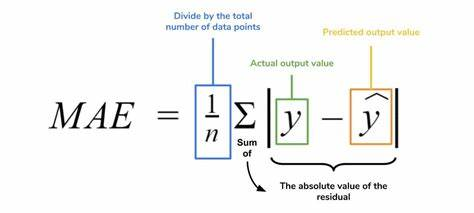
<br>
    - ∑ is sigma (the sum of a sequence or function)<br>
    - ŷi is the predicted value of data i<br>
    - yi is the actual value of data i<br>
    - n is the number of data<br>

* **[3] MAPE (Mean Absolute Percentage Error)**
MAPE is an evaluation metric used to view the error in terms of a percentage of the true value. This gives an idea of ​​the extent to which Machine Learning predictions are close to the actual values ​​in percentage form.
1. Evaluation in Percentage Form: MAPE measures the prediction error in percentage terms, which allows us to assess the level of accuracy of the model relative to the actual price.
2. Suitable for Price Prediction: MAPE is suitable for use in the case of price prediction because prices generally do not have a value of 0, so MAPE being sensitive to the value of 0 is impossible in this case.

The MAPE formula is as follows:
<br>
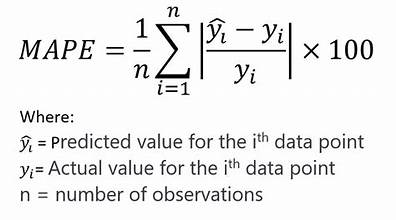
<br>
    - ∑ is sigma (the sum of a sequence or function)<br>
    - ŷi is the predicted value of data i<br>
    - yi is the actual value of data i<br>
    - n is the number of data<br>

## Limitations

* The Model is only designed to **predict** house prices for a **specific circumstance/setting:**
    * **Location:** California, USA
    * **Time:** 1990
    * **Specifics:** based only on a single dataset from the  following paper: Pace, R. Kelley, and Ronald Barry. "Sparse spatial autoregressions." Statistics & Probability Letters 33.3 (1997): 291-297.
* **Disclaimer:** Any Predictions made **outside** of the required and intended context should **not** be subjected as **reference**

# 2. Data Understanding

## Load Dataset

In [3]:
# If (UNSTRUCTURED) use -> encoding='ISO-8859-1'
# Importing Dataset 

df = pd.read_csv("data_california_house.csv")
df
# tips = sns.load_dataset('tips')
# tips
# cancer = load_breast_cancer()
# df = pd.DataFrame(data=cancer.data, columns=cancer.feature_names)
# df

# Initial Data Stats
# 14448 rows × 10 columns

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52.0,112.0,28.0,193.0,40.0,1.9750,INLAND,47500.0
1,-122.21,37.77,43.0,1017.0,328.0,836.0,277.0,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17.0,2358.0,396.0,1387.0,364.0,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17.0,2518.0,1196.0,3051.0,1000.0,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND,59200.0
...,...,...,...,...,...,...,...,...,...,...
14443,-121.26,38.27,20.0,1314.0,229.0,712.0,219.0,4.4125,INLAND,144600.0
14444,-120.89,37.48,27.0,1118.0,195.0,647.0,209.0,2.9135,INLAND,159400.0
14445,-121.90,36.58,31.0,1431.0,NaN,704.0,393.0,3.1977,NEAR OCEAN,289300.0
14446,-117.93,33.62,34.0,2125.0,498.0,1052.0,468.0,5.6315,<1H OCEAN,484600.0


| **Column Name**                        | **Explanation**                                                                                                                                                                |
| ----------------------------------- | -------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Longitude**                       | A measure of how far west a house is; a more negative value is farther west                                                                                                                 |
| **Latitude**                           | A measure of how far north a house is; a higher value is farther north                                                                                     |
| **Housing Median Age**                    | Median age of a house within a block; a lower number is a newer building renewal                                                                         |
| **Total Rooms**                    | Total number of rooms within a block                                                                                            |
| **Total Bedrooms**                      | Total number of bedrooms within a block                                                                                                        |
| **Population**                          | Total number of people residing within a block                                                                            |
| **Households**                  | Total number of households, a group of people residing within a home unit, for a block                                                                                 |
| **Median Income**               | Median income for households within a block of houses (measured in tens of thousands of US Dollars)                                                                                                  |
| **Ocean Proximity**                  | Location of the house with respect to the ocean/sea                                                                    |
| **Median House Value**                             | Median house value for households within a block (measured in US Dollars)                                                                                                                                         |


## Numerical, Categorical, and Target Features

In [4]:
# Numerical
# 0   longitude           14448 non-null  float64
#  1   latitude            14448 non-null  float64
#  2   housing_median_age  14448 non-null  float64
#  3   total_rooms         14448 non-null  float64
#  4   total_bedrooms      14311 non-null  float64
#  5   population          14448 non-null  float64
#  6   households          14448 non-null  float64
#  7   median_income       14448 non-null  float64

# Categorical
# ocean_proximity     14448 non-null  object 

# Target
# median_house_value  14448 non-null  float64

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14448 entries, 0 to 14447
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           14448 non-null  float64
 1   latitude            14448 non-null  float64
 2   housing_median_age  14448 non-null  float64
 3   total_rooms         14448 non-null  float64
 4   total_bedrooms      14311 non-null  float64
 5   population          14448 non-null  float64
 6   households          14448 non-null  float64
 7   median_income       14448 non-null  float64
 8   ocean_proximity     14448 non-null  object 
 9   median_house_value  14448 non-null  float64
dtypes: float64(9), object(1)
memory usage: 1.1+ MB


## Data Summary

In [5]:
# Initial: 9 Numerical & 1 Categorical
display(df.describe(include='object'), df.describe())

,ocean_proximity
count,14448
unique,5
top,<1H OCEAN
freq,6369


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,14448.000000,14448.000000,14448.000000,14448.000000,14311.000000,14448.000000,14448.000000,14448.000000,14448.000000
mean,-119.566647,35.630093,28.618702,2640.132683,538.260709,1425.157323,499.508929,3.866667,206824.624516
std,2.006587,2.140121,12.596694,2191.612441,423.577544,1149.580157,383.098390,1.891158,115365.476182
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1451.000000,295.000000,784.000000,279.000000,2.570600,119600.000000
50%,-118.490000,34.260000,29.000000,2125.000000,435.000000,1165.000000,410.000000,3.539100,180000.000000
75%,-118.000000,37.710000,37.000000,3148.000000,647.000000,1724.000000,604.000000,4.736100,263900.000000
max,-114.310000,41.950000,52.000000,32627.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


## Statistical Description for Numerical and Categorical Features

In [6]:
# Check Data Nullity, Unique Values
# pd.set_option('display.max_colwidth', None)

pd.DataFrame({
    'feature' : df.columns.values,
    'data_type' : df.dtypes.values,
    'nullity' : df.isna().mean().values * 100,
    'negative val' : [True if df[i].dtype == int and (df[i] < 0).any() else False for i in df.columns],
    'n_unique' : df.nunique().values,
    'sample_unique' : [df[i].unique() for i in df.columns]
})

,feature,data_type,nullity,negative val,n_unique,sample_unique
0,longitude,float64,0.000000,False,806,"[-119.79, -122.21, -118.04, -118.28, -119.81, ..."
1,latitude,float64,0.000000,False,836,"[36.73, 37.77, 33.87, 34.06, 33.8, 33.81, 38.6..."
2,housing_median_age,float64,0.000000,False,52,"[52.0, 43.0, 17.0, 50.0, 11.0, 14.0, 6.0, 10.0..."
3,total_rooms,float64,0.000000,False,5227,"[112.0, 1017.0, 2358.0, 2518.0, 772.0, 10535.0..."
4,total_bedrooms,float64,0.948228,False,1748,"[28.0, 328.0, 396.0, 1196.0, 194.0, 1620.0, 14..."
5,population,float64,0.000000,False,3498,"[193.0, 836.0, 1387.0, 3051.0, 606.0, 4409.0, ..."
6,households,float64,0.000000,False,1649,"[40.0, 277.0, 364.0, 1000.0, 167.0, 1622.0, 14..."
7,median_income,float64,0.000000,False,9797,"[1.975, 2.2604, 6.299, 1.7199, 2.2206, 6.67, 8..."
8,ocean_proximity,object,0.000000,False,5,"[INLAND, NEAR BAY, <1H OCEAN, NEAR OCEAN, ISLAND]"
9,median_house_value,float64,0.000000,False,3548,"[47500.0, 100000.0, 285800.0, 175000.0, 59200...."


## Missing Values

* Only the "df['total_bedrooms']" has **misisng values**, at a quantity of 137. Can be visualised clearly by the white lines on the **MSN Matrix** below

In [7]:
df.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        137
population              0
households              0
median_income           0
ocean_proximity         0
median_house_value      0
dtype: int64

<Axes: >

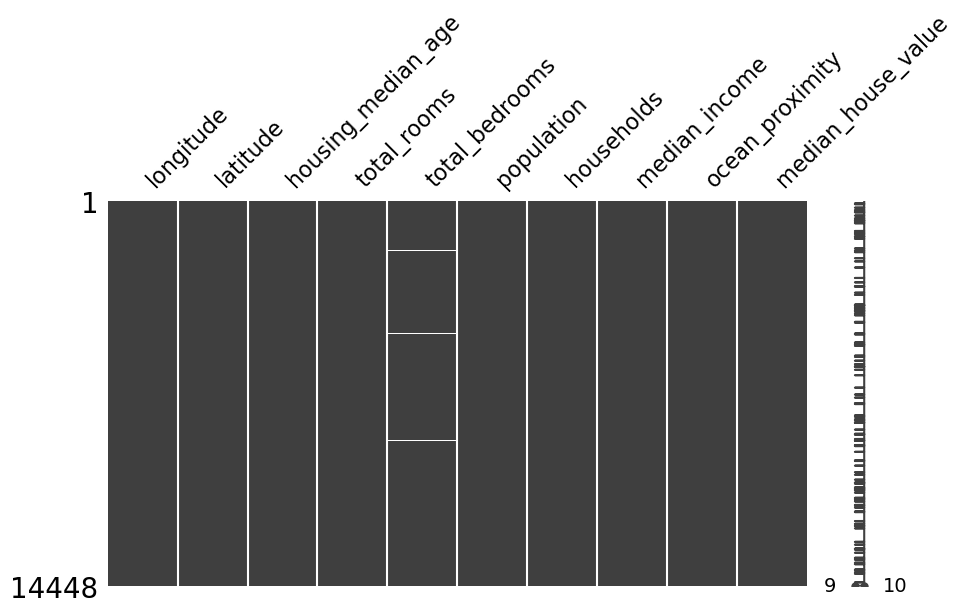

In [8]:
# MSN
# msn.matrix(df[['workclass', 'occupation', 'native.country']], figsize=(10,3))
msn.matrix(df, figsize=(10,5))

## Data Duplicates

* There is **no Data Duplicates** found. It is good to remove duplciated first as it can impact the ML Model training to overfit to examples that occur more common (repeatedly = duplicates)

In [9]:
df.duplicated().sum()

0

## Identify Invalid Data

* **Action 1:** All the Numerical & Non-Geographical Columns Except "median_house_value" & "median_income"  & "longitude" & "latitude" should be **converted to Integers**
* Since "number of people" or "number of household" are **Discrete and NOT Continuous** by nature -> no need to use the Float Data Type
* **Action 2:** The "df['ocean_proximity'] == ISLAND" should be **deleted**
* Since it is very **insignificant** to the dataset and ML Model training due to **ultra-low quantity**

In [10]:
df['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     6369
INLAND        4576
NEAR OCEAN    1879
NEAR BAY      1622
ISLAND           2
Name: count, dtype: int64

## Numerical Features Analysis

### Data Distribution

* Most of the Columns (features) are **"Right-Skew"**
* Hence, most of them have **Non-Parametric** (not normal/even) Distribution

In [11]:
# Select a subset of "Numerical" columns
num_columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']

In [12]:
# Do Statistical test for Distribution Normality Test on all "Numerical" and "High-Correlation" columns (after data preprocessing)
# helps decide .fillna() with mean, median, & mode
# Using Kolmogorov-Smirnov, Lilliefors, Shapiro-Wilk, & D’Agostino and Pearson’s Test

Test_Flag = 0
ks_statistics, ks_pval = kstest(df['housing_median_age'], 'norm')
shapiro_statistic, shapiro_pval = shapiro(df['housing_median_age'])
lf_statistics, lf_pval = lilliefors(df['housing_median_age'])
dp_statistics, dp_pval = normaltest(df['housing_median_age'])

# display(ks_statistics, ks_pval)
print(" ===== housing_median_age ===== ")

print("Kolmogorov-Smirnov Test")
if ks_pval > 0.05:
    print(f"P-Value: {ks_pval}. We assume it has Normal Distribution")   
    Test_Flag += 1
else:
    print(f"P-Value: {ks_pval}. We DO NOT assume it has Normal Distribution")   
    
print("Shapiro-Wilk Test")
if shapiro_pval > 0.05:
    print(f"P-Value: {shapiro_pval}. We assume it has Normal Distribution")  
    Test_Flag += 1 
else:
    print(f"P-Value: {shapiro_pval}. We DO NOT assume it has Normal Distribution") 
    
print("LillieforsTest")
if lf_pval > 0.05:
    print(f"P-Value: {lf_pval}. We assume it has Normal Distribution")   
    Test_Flag += 1
else:
    print(f"P-Value: {lf_pval}. We DO NOT assume it has Normal Distribution") 
    
print("D’Agostino and Pearson’s Test")
if dp_pval > 0.05:
    print(f"P-Value: {dp_pval}. We assume it has Normal Distribution")   
    Test_Flag += 1
else:
    print(f"P-Value: {dp_pval}. We DO NOT assume it has Normal Distribution") 
    
# Final Conclusion
if Test_Flag >= 3:
    print(f"We assume it HAS Normal Distribution. {Test_Flag}/4 tests passed")
else:
    print(f"We assume it DOES NOT has Normal Distribution. {Test_Flag}/4 tests passed")

 ===== housing_median_age ===== 
Kolmogorov-Smirnov Test
P-Value: 0.0. We DO NOT assume it has Normal Distribution
Shapiro-Wilk Test
P-Value: 6.905598832192699e-42. We DO NOT assume it has Normal Distribution
LillieforsTest
P-Value: 0.0009999999999998899. We DO NOT assume it has Normal Distribution
D’Agostino and Pearson’s Test
P-Value: 9.374485886350024e-264. We DO NOT assume it has Normal Distribution
We assume it DOES NOT has Normal Distribution. 0/4 tests passed


In [13]:
# Version to Iteraten through all Numerical Column
counter = 0
for i in num_columns:
    counter += 1
    Test_Flag = 0
    ks_statistics, ks_pval = kstest(df[i], 'norm')
    shapiro_statistic, shapiro_pval = shapiro(df[i])
    lf_statistics, lf_pval = lilliefors(df[i])
    dp_statistics, dp_pval = normaltest(df[i])
    
    if ks_pval > 0.05:  
        Test_Flag += 1
    if shapiro_pval > 0.05:  
        Test_Flag += 1
    if lf_pval > 0.05:  
        Test_Flag += 1
    if dp_pval > 0.05:  
        Test_Flag += 1
        
    # Final Conclusion
    if Test_Flag >= 3:
        print(f"Feature {counter}: We assume df[\"{i}\"] HAVE Normal Distribution. {Test_Flag}/4 tests passed")
    else:
        print(f"Feature {counter}: We assume df[\"{i}\"] DOES NOT have Normal Distribution. {Test_Flag}/4 tests passed")

Feature 1: We assume df["longitude"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 2: We assume df["latitude"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 3: We assume df["housing_median_age"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 4: We assume df["total_rooms"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 5: We assume df["total_bedrooms"] DOES NOT have Normal Distribution. 1/4 tests passed
Feature 6: We assume df["population"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 7: We assume df["households"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 8: We assume df["median_income"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 9: We assume df["median_house_value"] DOES NOT have Normal Distribution. 0/4 tests passed


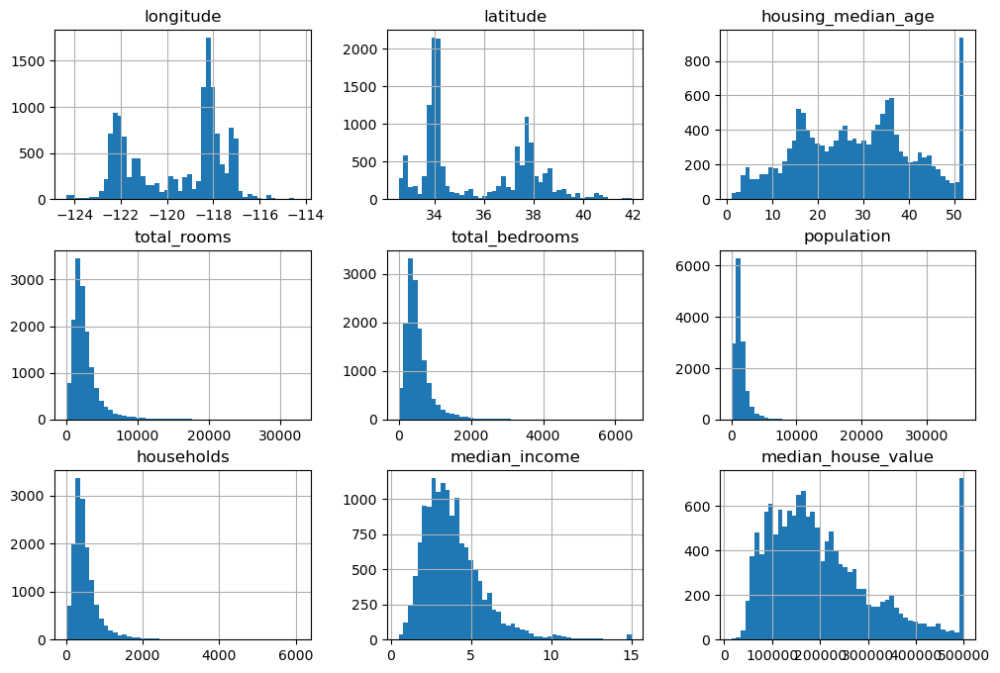

In [16]:
# Before Preprocessing
df.hist(bins=50, figsize=(12,8))
plt.show()

# More Detailed Version - 1
# plt.figure(figsize=(25, 25))
# plotnumber = 1
# num_features = df.select_dtypes(include='number').columns

# for feature in num_features:
#     ax = plt.subplot(5, 3, plotnumber)
#     sns.histplot(data=df,x=feature,color='cornflowerblue',bins=80).set_title(feature, fontsize=20)
#     plotnumber += 1
#     plt.tight_layout()

# More Detailed Version - 2
# fig,axis = plt.subplots(ncols=4,nrows=3,figsize=(20,10))
# index = 0
# axis = axis.flatten()
# for k, v in df.select_dtypes(include=[np.number]).items():
#     axis[index].set_title(k)
#     sns.distplot(x=df[k],ax=axis[index])
#     index += 1
# plt.tight_layout(w_pad=5,h_pad=2)
# plt.show()

### Identify Outliers

* Outlier Threshold to be deleted: 95th percentile
* 6 Numerical Columns have Outliers: 
    * 1. "total_rooms"	
    * 2. "total_bedrooms"	
    * 3. "population"	
    * 4. "households"	
    * 5. "median_income"	
    * 6. "median_house_value"	

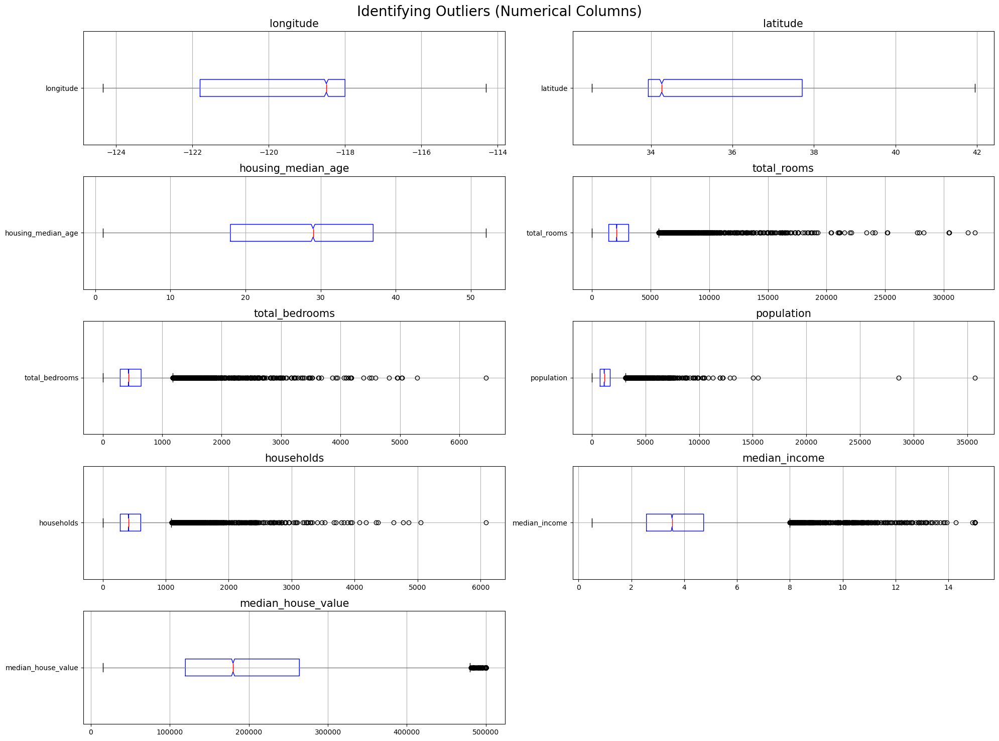

In [14]:
# sns.boxplot(data=df_tj, x=df_tj['stopEndSeq'], orient='v', ax=axes[1, 1])
# axes[1, 1].set_xlabel('stopEndSeq', fontsize=20)

# ===== Vertical Version =====
# fig, axis = plt.subplots(ncols=3,nrows=3,figsize=(10,20))
# index = 0
# axis = axis.flatten()
# for a, b in df.select_dtypes(include=[np.number]).items():
#     sns.boxplot(y=a, data=df, ax=axis[index])
#     index += 1
# plt.tight_layout(w_pad=0.5, h_pad=2)

# ===== Horizontal Version ===== (Identifying & later for Outlier Filetering Validation)
plot = 1
plt.figure(figsize=(20,15))
for feature in num_columns:
    plt.subplot(5,2,plot)
    df.boxplot(column=feature, whis=1.5, grid=True, vert=False, notch=True, color=dict(boxes='Blue', whiskers='Gray', medians='Red', caps='Black'))
    plt.title(feature, size=15)
    plt.tight_layout()
    plot += 1
plt.suptitle('Identifying Outliers (Numerical Columns)', size=20)
plt.tight_layout()
plt.show()

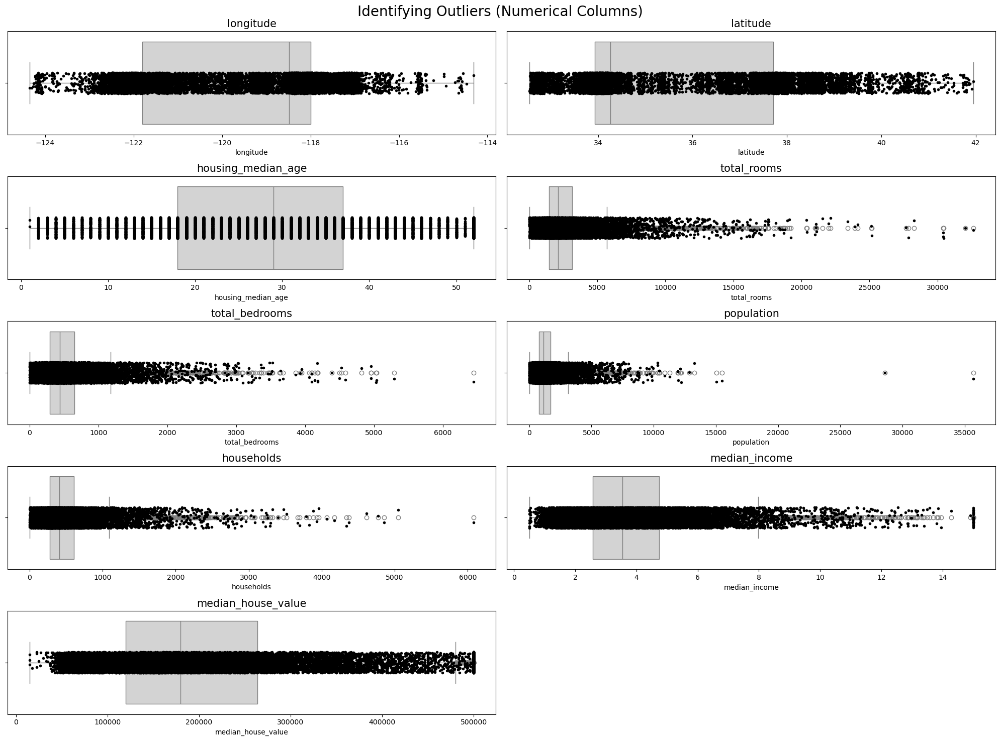

In [15]:
# ===== Horizontal Version =====
plot = 1
plt.figure(figsize=(20,15))
for feature in num_columns:
    plt.subplot(5,2,plot)
    sns.boxplot(x=feature, data=df, color='lightgray')
    sns.stripplot(x=feature, data=df, jitter=True, color='black', size=4)
    plt.title(feature, size=15)
    plt.tight_layout()
    plot += 1
    # Create a combined box plot and strip plot
plt.suptitle('Identifying Outliers (Numerical Columns)', size=20)
plt.tight_layout()
plt.show()

In [16]:
# Outlier Bound Search
def find_anomalies(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    limit = iqr*1.5
    print(f'Q1: {q1}')
    print(f'Q3: {q3}')
    print(f'IQR: {iqr}')

    upper_limit = q3 + limit
    lower_limit = q1 - limit
    print(f'upper_whisker: {upper_limit}')
    print(f'lower_whisker: {lower_limit}')  

In [17]:
# Testing all 9 Numerical Variables
for feature in num_columns:
    print(f"===== df[{feature}] =====")
    find_anomalies(df[feature])
    print(f"\n")

===== df[longitude] =====
Q1: -121.8
Q3: -118.0
IQR: 3.799999999999997
upper_whisker: -112.30000000000001
lower_whisker: -127.5


===== df[latitude] =====
Q1: 33.93
Q3: 37.71
IQR: 3.780000000000001
upper_whisker: 43.38
lower_whisker: 28.259999999999998


===== df[housing_median_age] =====
Q1: 18.0
Q3: 37.0
IQR: 19.0
upper_whisker: 65.5
lower_whisker: -10.5


===== df[total_rooms] =====
Q1: 1451.0
Q3: 3148.0
IQR: 1697.0
upper_whisker: 5693.5
lower_whisker: -1094.5


===== df[total_bedrooms] =====
Q1: 295.0
Q3: 647.0
IQR: 352.0
upper_whisker: 1175.0
lower_whisker: -233.0


===== df[population] =====
Q1: 784.0
Q3: 1724.0
IQR: 940.0
upper_whisker: 3134.0
lower_whisker: -626.0


===== df[households] =====
Q1: 279.0
Q3: 604.0
IQR: 325.0
upper_whisker: 1091.5
lower_whisker: -208.5


===== df[median_income] =====
Q1: 2.5705999999999998
Q3: 4.7361
IQR: 2.1655000000000006
upper_whisker: 7.984350000000001
lower_whisker: -0.6776500000000012


===== df[median_house_value] =====
Q1: 119600.0
Q3: 263

## Categorical Features Analysis

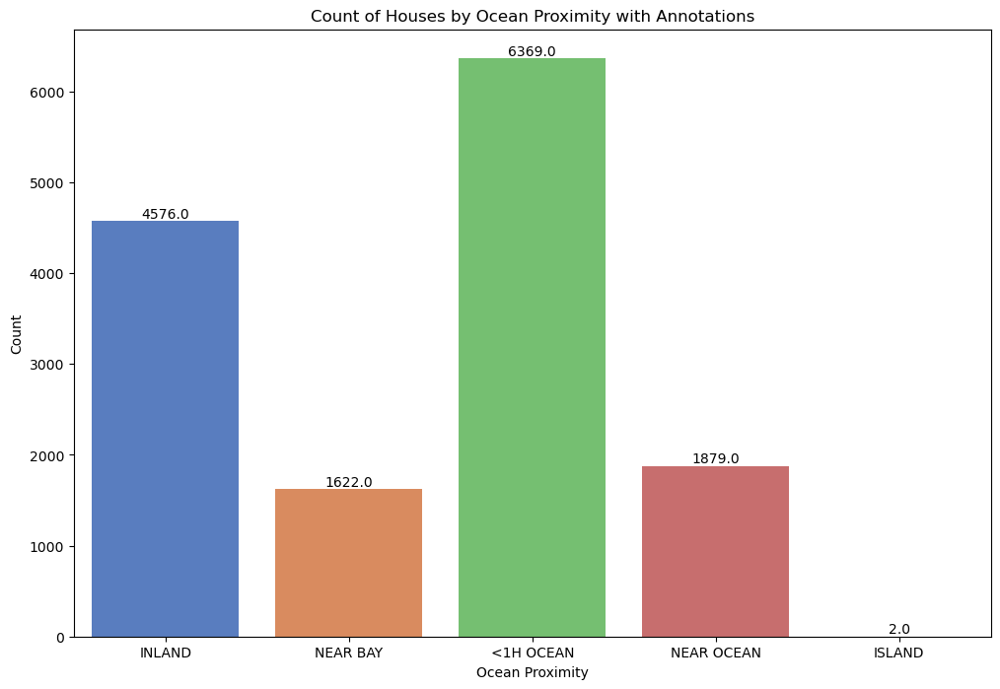

In [18]:
# Simple CountPlot
# sns.countplot(data=df, x='ocean_proximity')
# plt.title('Count of Houses by Ocean Proximity with Annotations', size=12)

# Count plot + Bar Annotations
plt.figure(figsize=(12, 8))
ax = sns.countplot(x='ocean_proximity', data=df, palette='muted')

# Adding annotations
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom') # va='baseline'

plt.title('Count of Houses by Ocean Proximity with Annotations')
plt.xlabel('Ocean Proximity')
plt.ylabel('Count')
plt.show()

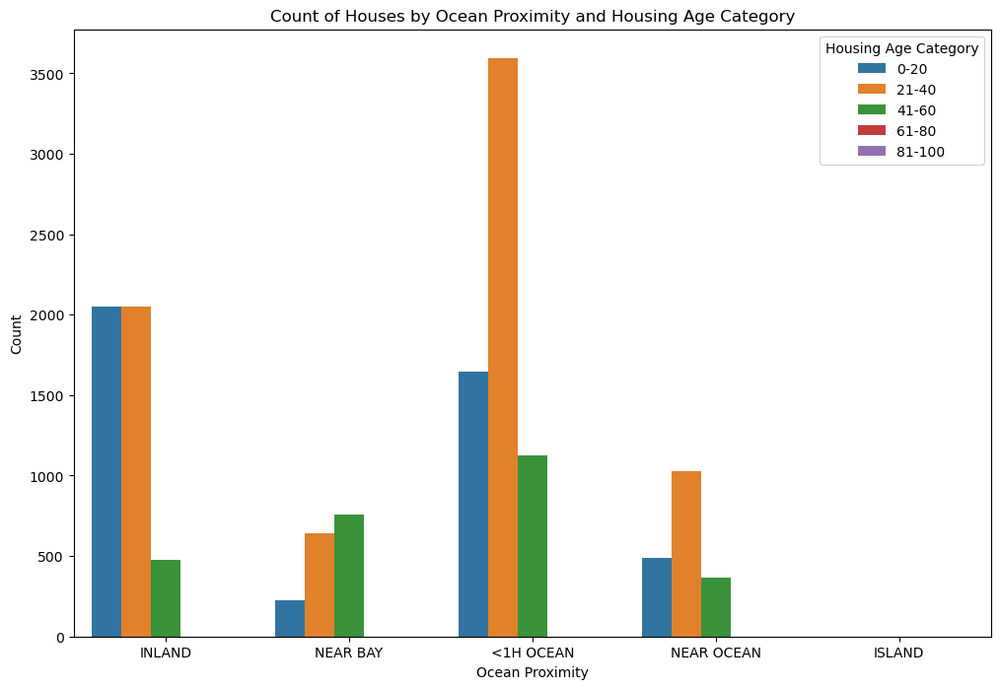

In [19]:
# Create an age category column for visualization (part of Feature Engineering)
df['age_category'] = pd.cut(df['housing_median_age'], bins=[0, 20, 40, 60, 80, 100], labels=['0-20', '21-40', '41-60', '61-80', '81-100'])

# Count plot with hue
plt.figure(figsize=(12, 8))
sns.countplot(x='ocean_proximity', hue='age_category', data=df)
plt.title('Count of Houses by Ocean Proximity and Housing Age Category')
plt.xlabel('Ocean Proximity')
plt.ylabel('Count')
plt.legend(title='Housing Age Category')
plt.show()


### Pivoting

* drawing insights from **aggregating column statistics** based on the only Categorical column available ("ocean_proximity") and finding **averages/mean** of the Numerical columns
* by making the **values** of the column **"ocean_proximity" as  column** and the **other Numerical columns as the rows**, all using the same index

In [20]:
# multi_agg_func ['mean', 'median', 'std']
pivot_mean = df.pivot_table(index='ocean_proximity', 
                                   values=num_columns, 
                                   aggfunc='mean' , 
                                   margins=True, 
                                   margins_name='Total'
                                   )
pivot_median = df.pivot_table(index='ocean_proximity', 
                                   values=num_columns, 
                                   aggfunc='median' , 
                                   margins=True, 
                                   margins_name='Total'
                                   )
pivot_std = df.pivot_table(index='ocean_proximity', 
                                   values=num_columns, 
                                   aggfunc='std' , 
                                   margins=True, 
                                   margins_name='Total'
                                   )
display("===== MEAN =====",pivot_mean.reset_index(), "===== MEDIAN =====", pivot_median.reset_index(), "===== STANDARD DEVIATION =====",    pivot_std.reset_index()) # reset_index to convert as Dataframe

'===== MEAN ====='

,ocean_proximity,households,housing_median_age,latitude,longitude,median_house_value,median_income,population,total_bedrooms,total_rooms
0,<1H OCEAN,517.237243,29.243680,34.557157,-118.844966,239652.436960,4.224854,1521.018684,546.166508,2626.203800
1,INLAND,479.372378,24.239729,36.712716,-119.711117,125113.114510,3.197080,1393.245629,536.865977,2733.680726
2,ISLAND,302.000000,40.500000,33.385000,-118.405000,351100.000000,2.718750,761.000000,402.500000,1537.500000
3,NEAR BAY,479.975339,37.655980,37.803181,-122.259679,258512.974723,4.179790,1208.284217,507.196273,2452.847719
4,NEAR OCEAN,505.529005,29.350718,34.756860,-119.337541,249775.384247,4.014166,1365.861629,541.935310,2622.367217
5,Total,499.480470,28.609671,35.631365,-119.567150,206793.156942,3.866774,1424.772273,538.260709,2640.917686


'===== MEDIAN ====='

,ocean_proximity,households,housing_median_age,latitude,longitude,median_house_value,median_income,population,total_bedrooms,total_rooms
0,<1H OCEAN,422.0,30.0,34.030,-118.280,214800.0,3.88750,1246.0,439.0,2099.0
1,INLAND,387.0,23.0,36.930,-119.960,108800.0,2.98485,1127.5,424.0,2133.0
2,ISLAND,302.0,40.5,33.385,-118.405,351100.0,2.71875,761.0,402.5,1537.5
3,NEAR BAY,401.5,39.0,37.790,-122.250,230800.0,3.81920,1029.0,419.0,2079.5
4,NEAR OCEAN,433.0,29.0,33.790,-118.240,228600.0,3.68060,1137.0,466.0,2197.0
5,Total,410.0,29.0,34.260,-118.490,180000.0,3.54030,1164.0,435.0,2125.0


'===== STANDARD DEVIATION ====='

,ocean_proximity,households,housing_median_age,latitude,longitude,median_house_value,median_income,population,total_bedrooms,total_rooms
0,<1H OCEAN,391.751378,11.662347,1.469385,1.589670,105751.529983,2.006184,1227.142716,427.428778,2161.478056
1,INLAND,396.409238,11.968575,2.121269,1.896047,70128.470962,1.396284,1165.649708,452.647544,2405.064920
2,ISLAND,182.433550,16.263456,0.063640,0.106066,89943.982567,0.161998,479.418398,266.579257,1161.776441
3,NEAR BAY,337.545445,13.161926,0.185480,0.146658,123794.049463,2.034724,847.402585,361.615330,1769.438069
4,NEAR OCEAN,353.552925,11.898082,2.305216,2.343919,123091.200118,1.976662,1025.582699,383.988527,2063.813191
5,Total,383.826005,12.606493,2.139589,2.006374,115404.371629,1.890866,1151.795857,423.577544,2197.192896


# 3. Data Preparation

## Data Cleaning

### Handling Missing Values

In [21]:
# imputation through transformer (later, backup)
# isna (now)

# total_bedrooms initially has 137 null values
# df.isna().sum()

# since total_bedrooms has many outliers with extreme values
# we are going to use .fillna() and fills using the median value
# since median is more robust to outliers and total_bedrooms is a Numerical feature
# Fill missing values in 'Salary' with the median
df['total_bedrooms'].fillna(df['total_bedrooms'].median(), inplace=True)

### Handling Data Duplicates

In [22]:
# NONE Present (no need to handle, if there is one, it should be deleted)
duplicate_value = df[df.duplicated(subset=['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value'], keep=False)]
duplicate_value

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,age_category


### Handling Invalid Data

* **Action 1:** All the Numerical & Non-Geographical Columns Except "median_house_value" & "median_income" & "longitude" & "latitude" should be **converted to Integers**
* Since "number of people" or "number of household" are **Discrete and NOT Continuous** by nature -> no need to use the Float Data Type
* **Action 2:** The "df['ocean_proximity'] == ISLAND" should be **deleted**
* Since it is very **insignificant** to the dataset and ML Model training due to **ultra-low quantity**

In [ ]:
# ===== Data Conversion =====
# Object -> Integer (conversion uneeded)
# df['ocean_proximity'] = df['ocean_proximity'].map({'INLAND':1,'NEAR BAY':2,'<1H OCEAN':3,'NEAR OCEAN':4,'ISLAND':5})
# df['ocean_proximity'].value_counts()

In [ ]:
# ===== Inconsistent Data Searching =====
# pd.set_option('display.max_colwidth', None)
# cat = []
# for i in df.describe(include=object).columns:
#     cat.append([i, list(df[i].drop_duplicates().values)])
# df_cat = pd.DataFrame(columns=['feature', 'unique'], data=cat)
# df_cat

# ===== Inconsistent Data Correcting =====
# Data Alteration
# df['TimeToSubway'] = df['TimeToSubway'].replace({
#     '10min~15min': '10-15min',
#     '15min~20min': '15-20min',
#     '5min~10min': '5-10min'
# })
# Validating Alteration
# df['TimeToSubway'].unique()

In [23]:
# ===== ACTION 1 =====
num_columns_for_edit = ['housing_median_age','total_rooms','total_bedrooms','population','households'
]

# Modifying
for i in num_columns_for_edit:
    df[i] = df[i].astype('int64')

# Validating
df[['housing_median_age','total_rooms','total_bedrooms','population','households']].dtypes

housing_median_age    int64
total_rooms           int64
total_bedrooms        int64
population            int64
households            int64
dtype: object

In [24]:
# ===== ACTION 2 =====

# Check & Recheck value_counts of df['ocean_proximity'] == "ISLAND" = 2
# df['ocean_proximity'].value_counts()

# Drop rows where 'ocean_proximity' column contains 'ISLAND' in place
df.drop(df[df['ocean_proximity'] == 'ISLAND'].index, inplace=True)

In [25]:
# Extra (check if there is any data where total_bedrooms > total_rooms -> impossible)
df[df['total_rooms'] <= df['total_bedrooms']].value_counts()

# Out of the 2 examples -> there is still NO total_bedrooms > total_rooms

longitude  latitude  housing_median_age  total_rooms  total_bedrooms  population  households  median_income  ocean_proximity  median_house_value  age_category
-118.44    34.28     46                  11           11              24          13          2.875          <1H OCEAN        162500.0            41-60           1
-117.79    35.21     4                   2            2               6           2           2.375          INLAND           137500.0            0-20            1
Name: count, dtype: int64

### Handling Outliers

* Outlier Threshold to be deleted: 98th percentile
* Default Rules by Assumed Contextual Relevancy
* 6 Numerical Columns have Outliers: 
    * 1. "total_rooms"	
    * 2. "total_bedrooms"	
    * 3. "population"	
    * 4. "households"	
    * 5. "median_income"	
    * 6. "median_house_value"

In [26]:
# Examples 
# df['housing_median_age'].where(df['housing_median_age'] < 50,other=50,inplace=True)

# Shape (Before)
print(f"Original dataset shape: {df.shape}")

# To be Utilised (6 Numerical Columns containing Outliers)
# Iterative Outlier Filtering

# THE TARGET VARIABLE
# Column 1
p_95 = np.percentile(df['median_house_value'],98)
df = df[df['median_house_value'] <= p_95].copy() # copying
# THE FEATURES (independent) VARIABLE
# Column 2
p_95 = np.percentile(df['total_bedrooms'],98)
df = df[df['total_bedrooms'] <= p_95].copy() # copying
# Column 3
p_95 = np.percentile(df['population'],98)
df = df[df['population'] <= p_95].copy() # copying
# Column 4
p_95 = np.percentile(df['households'],98)
df = df[df['households'] <= p_95].copy() # copying
# Column 5
p_95 = np.percentile(df['median_income'],98)
df = df[df['median_income'] <= p_95].copy() # copying
# Column 6
p_95 = np.percentile(df['total_rooms'],98)
df = df[df['total_rooms'] <= p_95].copy() # copying


# Alternatives
# Set the percentile thresholds
# lower_percentile = 0.05
# upper_percentile = 0.95
# # Calculate the percentile values
# lower_bound_f1 = df['Feature1'].quantile(lower_percentile)
# upper_bound_f1 = df['Feature1'].quantile(upper_percentile)
# # Filter out the outliers
# df_filtered = df[(df['Feature1'] >= lower_bound_f1) & (df['Feature1'] <= upper_bound_f1) &
#                  (df['Feature2'] >= lower_bound_f2) & (df['Feature2'] <= upper_bound_f2)]

# Shape (After) -> 10% reduction (acheived threshold)
print(f"Filtered dataset shape: {df.shape}")

Original dataset shape: (14446, 11)
Filtered dataset shape: (13062, 11)


In [ ]:
# Check for Eliminated/Filtered rows (df_clean is by intention not present for comparison)
# margin = df.shape[0] - df_clean.shape[0]
# margin_percentage = round(((margin / df.shape[0]) * 100),2)
# print(f"Jumlah baris terliminasi: {margin}") 
# print(f"Persentase baris terliminasi: {margin_percentage}%") 

## Convert Target Data to Binary Format (if Categorical)

* **NO NEED** since target (df["median_house_value]) is Numerical

## Recheck Missing Values, Data Duplicates, Data Type & Outliers
* after outliers deletion threshold (95th percentile)
* Much Cleaner and more balanced (Paramteric Distribution) with only 3 columns left with outliers -> which are already minimised

In [27]:
df.info()
# df.duplicated().sum()
# df.isna().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 13062 entries, 0 to 14447
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           13062 non-null  float64 
 1   latitude            13062 non-null  float64 
 2   housing_median_age  13062 non-null  int64   
 3   total_rooms         13062 non-null  int64   
 4   total_bedrooms      13062 non-null  int64   
 5   population          13062 non-null  int64   
 6   households          13062 non-null  int64   
 7   median_income       13062 non-null  float64 
 8   ocean_proximity     13062 non-null  object  
 9   median_house_value  13062 non-null  float64 
 10  age_category        13062 non-null  category
dtypes: category(1), float64(4), int64(5), object(1)
memory usage: 1.1+ MB


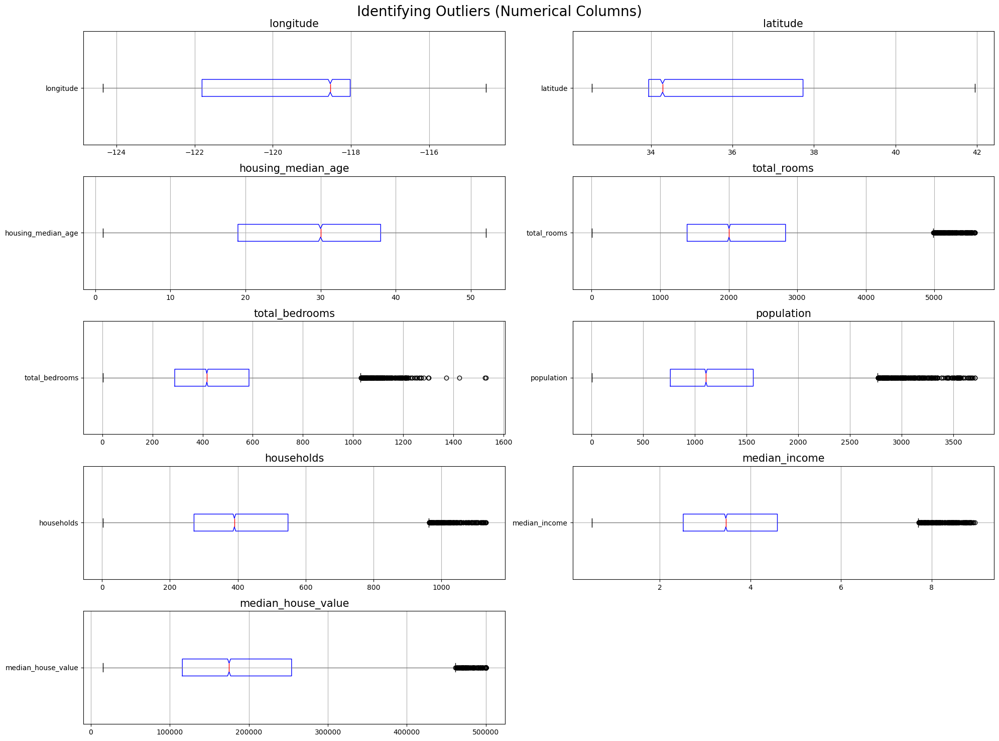

In [28]:
# ===== Horizontal Version ===== (Outlier Filetering Validation)
plot = 1
plt.figure(figsize=(20,15))
for feature in num_columns:
    plt.subplot(5,2,plot)
    df.boxplot(column=feature, whis=1.5, grid=True, vert=False, notch=True, color=dict(boxes='Blue', whiskers='Gray', medians='Red', caps='Black'))
    plt.title(feature, size=15)
    plt.tight_layout()
    plot += 1
plt.suptitle('Identifying Outliers (Numerical Columns)', size=20)
plt.tight_layout()
plt.show()

In [29]:
# Reseting to new Index after row deletion from "Data Preperation Process"
df.reset_index(inplace=True)

In [30]:
# dropping column to convert back to original data
df.drop(columns=['index', 'age_category'], inplace=True)
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52,112,28,193,40,1.9750,INLAND,47500.0
1,-122.21,37.77,43,1017,328,836,277,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17,2358,396,1387,364,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17,2518,1196,3051,1000,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50,772,194,606,167,2.2206,INLAND,59200.0
...,...,...,...,...,...,...,...,...,...,...
13057,-121.26,38.27,20,1314,229,712,219,4.4125,INLAND,144600.0
13058,-120.89,37.48,27,1118,195,647,209,2.9135,INLAND,159400.0
13059,-121.90,36.58,31,1431,435,704,393,3.1977,NEAR OCEAN,289300.0
13060,-117.93,33.62,34,2125,498,1052,468,5.6315,<1H OCEAN,484600.0


## Save Cleaned Data
* if it were to be used again as .csv

In [31]:
# Save the DataFrame to a CSV file
# df.to_csv('data_california_house_cleaned.csv')

# Save the DataFrame to a CSV file without the index
df.to_csv('data_california_house_cleaned.csv', index=False)

# Save the DataFrame to a CSV file with specific column order
# df.to_csv('data_california_house_cleaned.csv', columns=['Name', 'City', 'Age'], index=False)

# Save the DataFrame to a CSV file with a semicolon separator
# df.to_csv('data_california_house_cleaned.csv', sep=';', index=False)

# Save the DataFrame to a CSV file with UTF-8 encoding
# df.to_csv('data_california_house_cleaned_utf8.csv', index=False, encoding='utf-8')

# 4. Exploratory Data Analysis (EDA)

* Post **Data Preperation** (Cleaning)

In [5]:
# Load Data (CLEANED)

df_c = pd.read_csv("data_california_house_cleaned.csv")
df_c

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52,112,28,193,40,1.9750,INLAND,47500.0
1,-122.21,37.77,43,1017,328,836,277,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17,2358,396,1387,364,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17,2518,1196,3051,1000,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50,772,194,606,167,2.2206,INLAND,59200.0
...,...,...,...,...,...,...,...,...,...,...
13057,-121.26,38.27,20,1314,229,712,219,4.4125,INLAND,144600.0
13058,-120.89,37.48,27,1118,195,647,209,2.9135,INLAND,159400.0
13059,-121.90,36.58,31,1431,435,704,393,3.1977,NEAR OCEAN,289300.0
13060,-117.93,33.62,34,2125,498,1052,468,5.6315,<1H OCEAN,484600.0


## Geographical Analysis

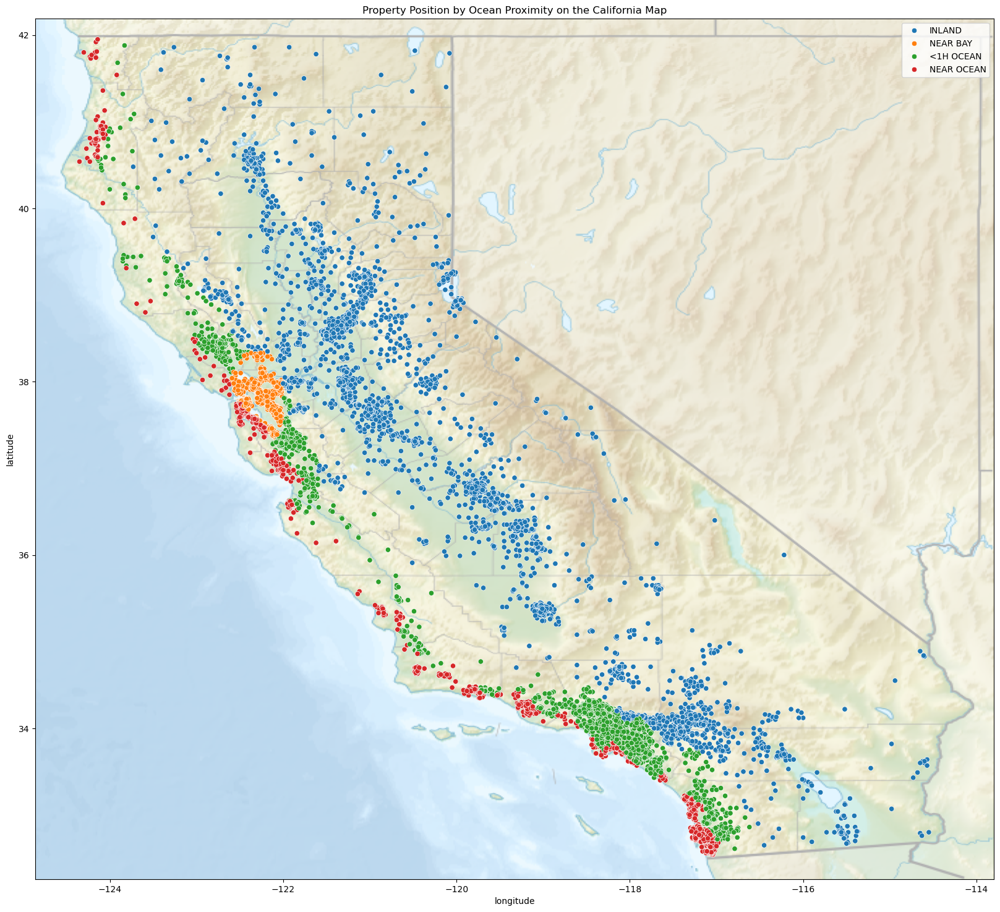

In [6]:
# Scatter plot 1
plt.figure(figsize=(20,20))
sns.scatterplot(data=df_c, x="longitude", y="latitude",hue=df_c['ocean_proximity']).set_title('Property Position by Ocean Proximity on the California Map')
california = mpimg.imread('california.png')
plt.imshow(california,extent=[-124.86, -113.8, 32.26, 42.19],alpha=0.5,cmap=plt.get_cmap('jet'))
plt.xlabel=('Longitude')
plt.ylabel=('Latitude')
plt.legend()
plt.show()

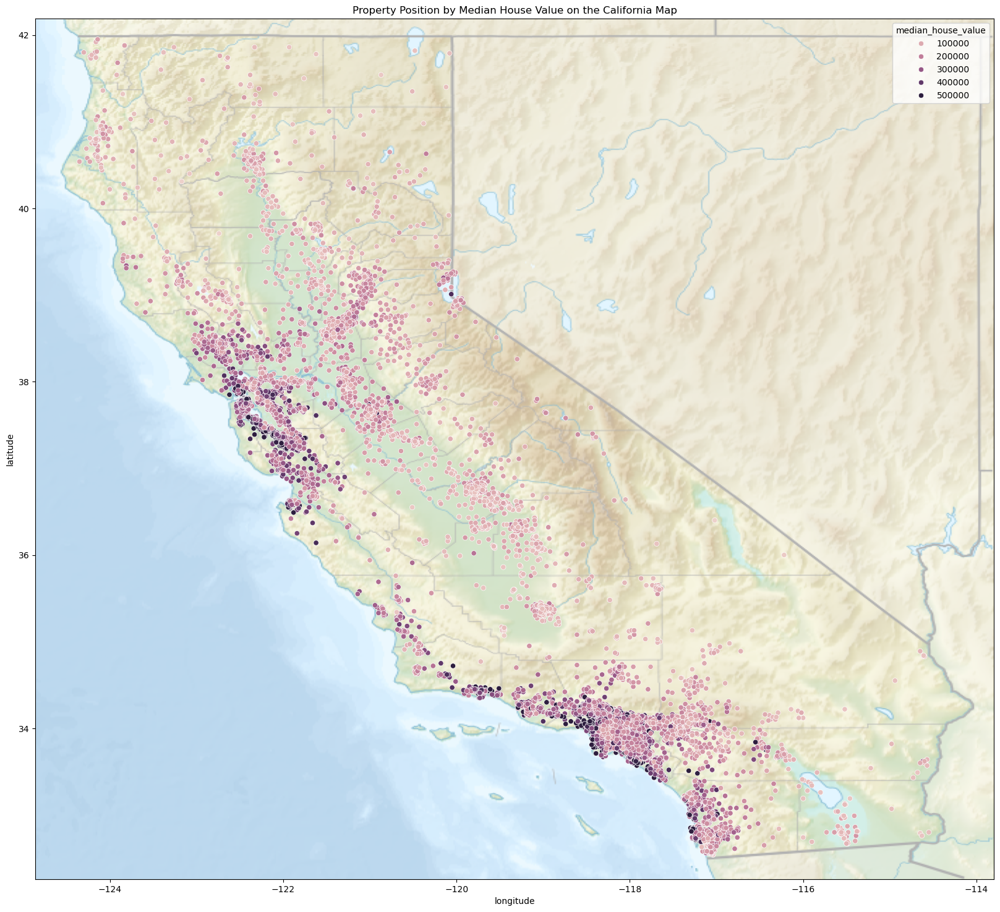

In [7]:
#Scatter plot 2 
# palette='viridis'
plt.figure(figsize=(20,20))
sns.scatterplot(data=df_c, x="longitude", y="latitude",hue=df_c['median_house_value']).set_title('Property Position by Median House Value on the California Map')
california = mpimg.imread('california.png')
plt.imshow(california,extent=[-124.86, -113.8, 32.26, 42.19],alpha=0.5,cmap=plt.get_cmap('jet'))
plt.xlabel=('Longitude')
plt.ylabel=('Latitude')
plt.show()

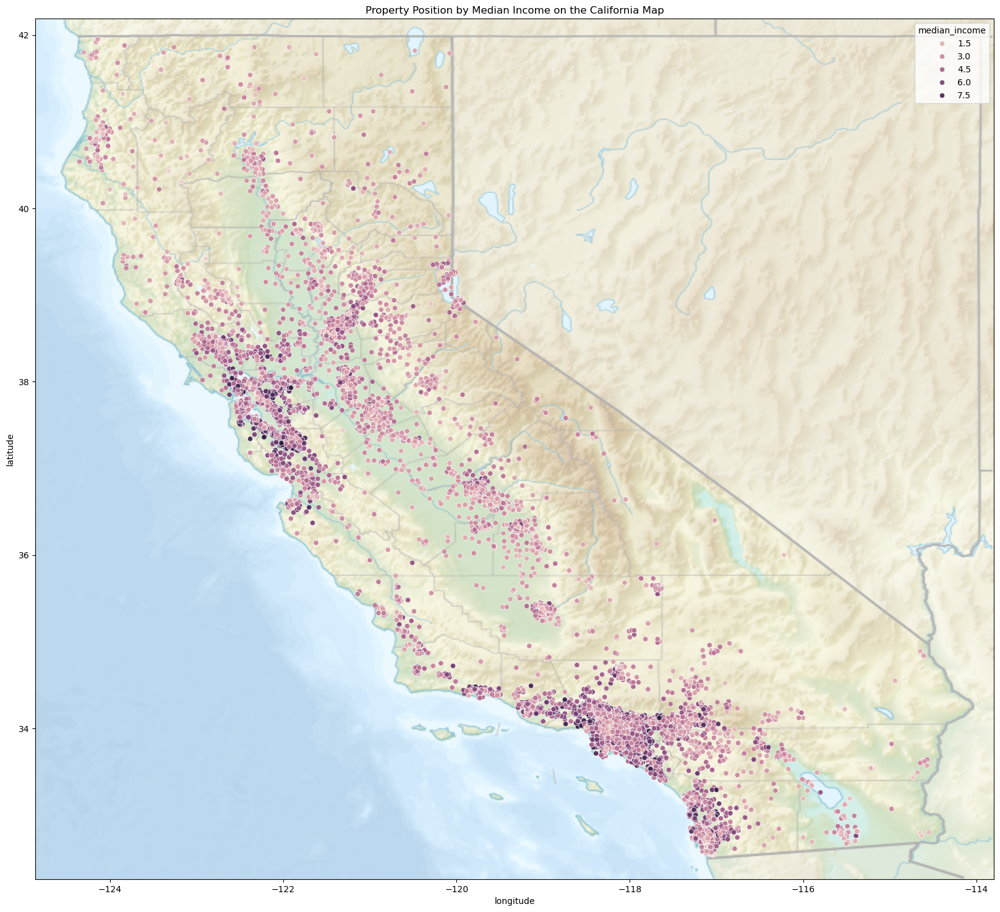

In [8]:
# Scatter plot 3
plt.figure(figsize=(20,20))
sns.scatterplot(data=df_c, x="longitude", y="latitude",hue=df_c['median_income']).set_title('Property Position by Median Income on the California Map')
california = mpimg.imread('california.png')
plt.imshow(california,extent=[-124.86, -113.8, 32.26, 42.19],alpha=0.5,cmap=plt.get_cmap('jet'))
plt.xlabel=('Longitude')
plt.ylabel=('Latitude')
plt.show()

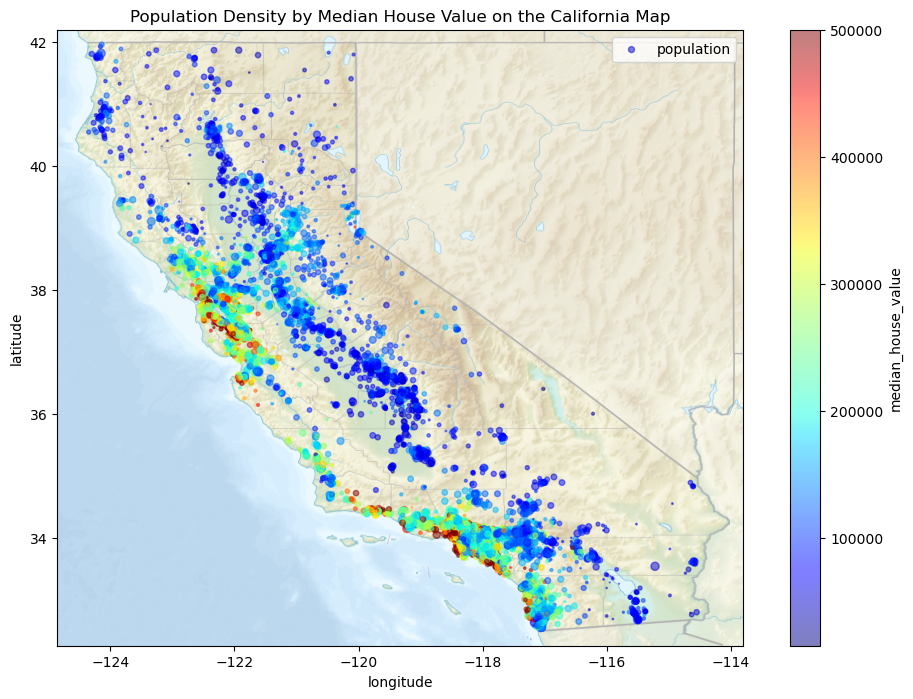

In [10]:
# Scatter plot 4
ax = df_c.plot(kind='scatter',x='longitude',y='latitude',alpha = 0.5,
             s=df_c['population']/100,label='population',figsize=(12,8),
             c='median_house_value',cmap=plt.get_cmap('jet'),sharex=False).set_title('Population Density by Median House Value on the California Map')

california_img = mpimg.imread('california.png')
plt.imshow(california_img,extent=[-124.86, -113.8, 32.26, 42.19],alpha=0.5,cmap=plt.get_cmap('jet'))
plt.xlabel=('Longitude')
plt.ylabel=('Latitude')
plt.legend()
plt.show()

* Conclusion
* More expensive Houses are located nearer to the Ocean, it can be concluded (from the data provided) that ocean proximity palys a huge role in determining not just "Median Hosue Value" but also "Population" and density as well.

## Numerical Features Analysis (Post Data Preperation)

In [11]:
# Select a subset of "Numerical" columns
num_columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']

In [12]:
# Version to Iterate through all Numerical Column
counter = 0
for i in num_columns:
    counter += 1
    Test_Flag = 0
    ks_statistics, ks_pval = kstest(df_c[i], 'norm')
    shapiro_statistic, shapiro_pval = shapiro(df_c[i])
    lf_statistics, lf_pval = lilliefors(df_c[i])
    dp_statistics, dp_pval = normaltest(df_c[i])
    
    if ks_pval > 0.05:  
        Test_Flag += 1
    if shapiro_pval > 0.05:  
        Test_Flag += 1
    if lf_pval > 0.05:  
        Test_Flag += 1
    if dp_pval > 0.05:  
        Test_Flag += 1
        
    # Final Conclusion
    if Test_Flag >= 3:
        print(f"Feature {counter}: We assume df[\"{i}\"] HAVE Normal Distribution. {Test_Flag}/4 tests passed")
    else:
        print(f"Feature {counter}: We assume df[\"{i}\"] DOES NOT have Normal Distribution. {Test_Flag}/4 tests passed")

Feature 1: We assume df["longitude"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 2: We assume df["latitude"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 3: We assume df["housing_median_age"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 4: We assume df["total_rooms"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 5: We assume df["total_bedrooms"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 6: We assume df["population"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 7: We assume df["households"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 8: We assume df["median_income"] DOES NOT have Normal Distribution. 0/4 tests passed
Feature 9: We assume df["median_house_value"] DOES NOT have Normal Distribution. 0/4 tests passed


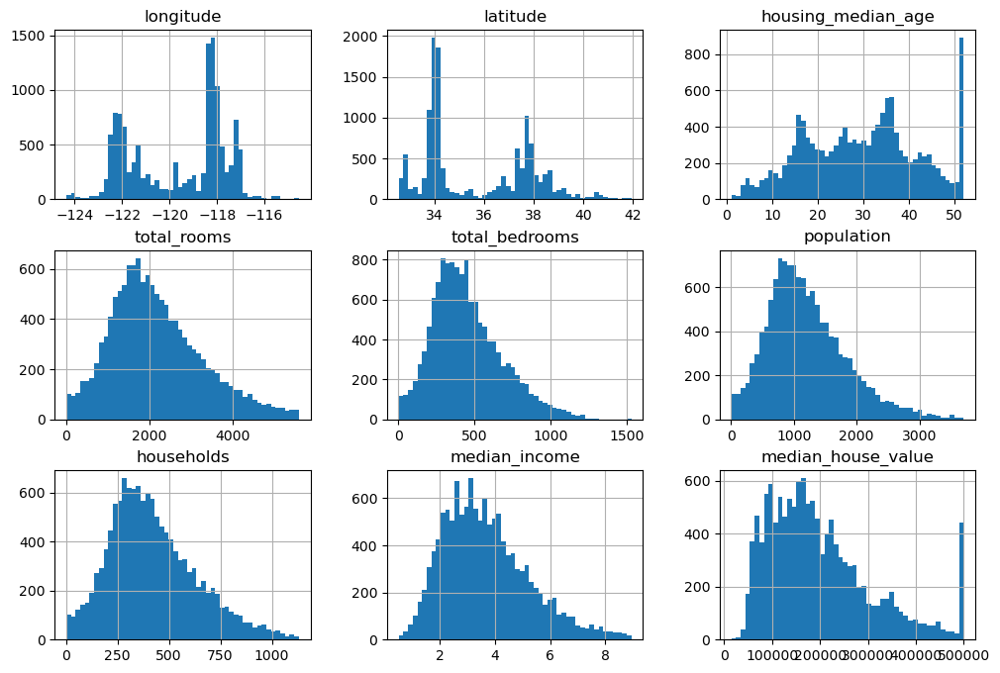

In [13]:
# After Preprocessing
df_c.hist(bins=50, figsize=(12,8))
plt.show()

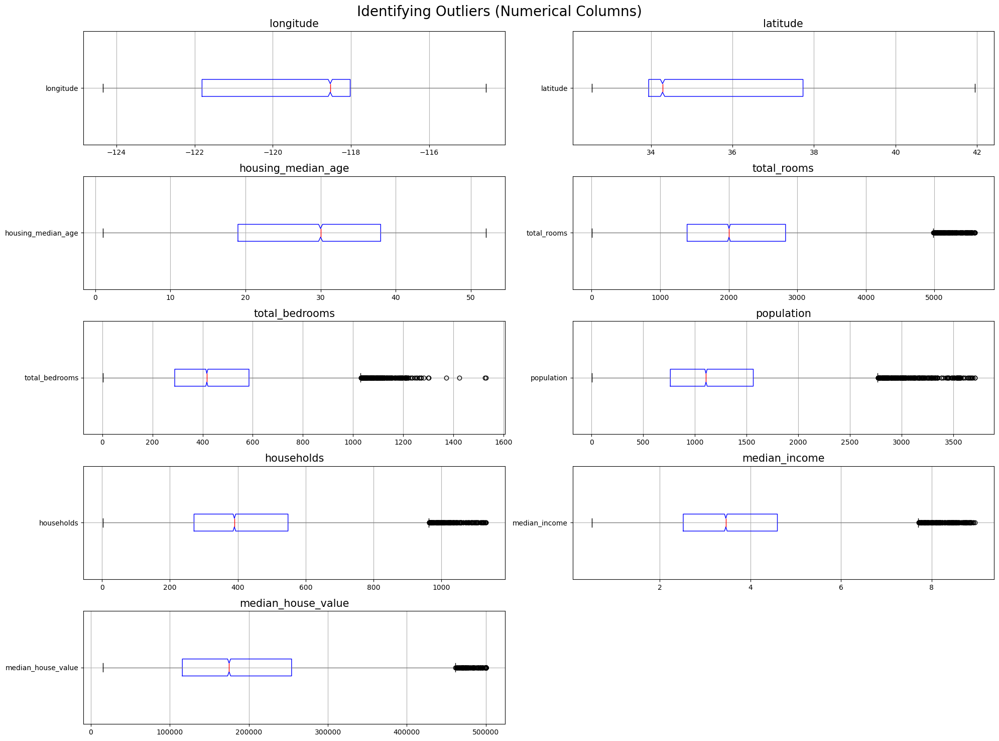

In [14]:
# ===== Horizontal Version ===== (Identifying & later for Outlier Filetering Validation)
plot = 1
plt.figure(figsize=(20,15))
for feature in num_columns:
    plt.subplot(5,2,plot)
    df_c.boxplot(column=feature, whis=1.5, grid=True, vert=False, notch=True, color=dict(boxes='Blue', whiskers='Gray', medians='Red', caps='Black'))
    plt.title(feature, size=15)
    plt.tight_layout()
    plot += 1
plt.suptitle('Identifying Outliers (Numerical Columns)', size=20)
plt.tight_layout()
plt.show()

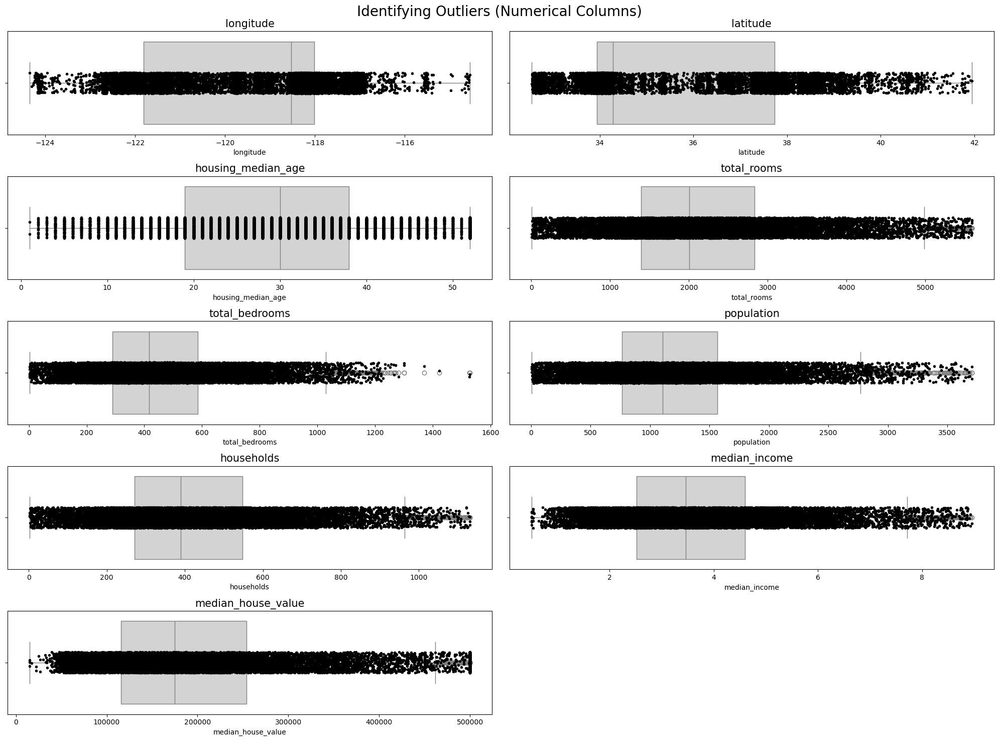

In [15]:
# ===== Horizontal Version =====
plot = 1
plt.figure(figsize=(20,15))
for feature in num_columns:
    plt.subplot(5,2,plot)
    sns.boxplot(x=feature, data=df_c, color='lightgray')
    sns.stripplot(x=feature, data=df_c, jitter=True, color='black', size=4)
    plt.title(feature, size=15)
    plt.tight_layout()
    plot += 1
    # Create a combined box plot and strip plot
plt.suptitle('Identifying Outliers (Numerical Columns)', size=20)
plt.tight_layout()
plt.show()

median_house_value    1.000000
median_income         0.664302
total_rooms           0.189994
households            0.105911
housing_median_age    0.092131
total_bedrooms        0.075788
population           -0.022833
longitude            -0.058187
latitude             -0.174263
Name: median_house_value, dtype: float64

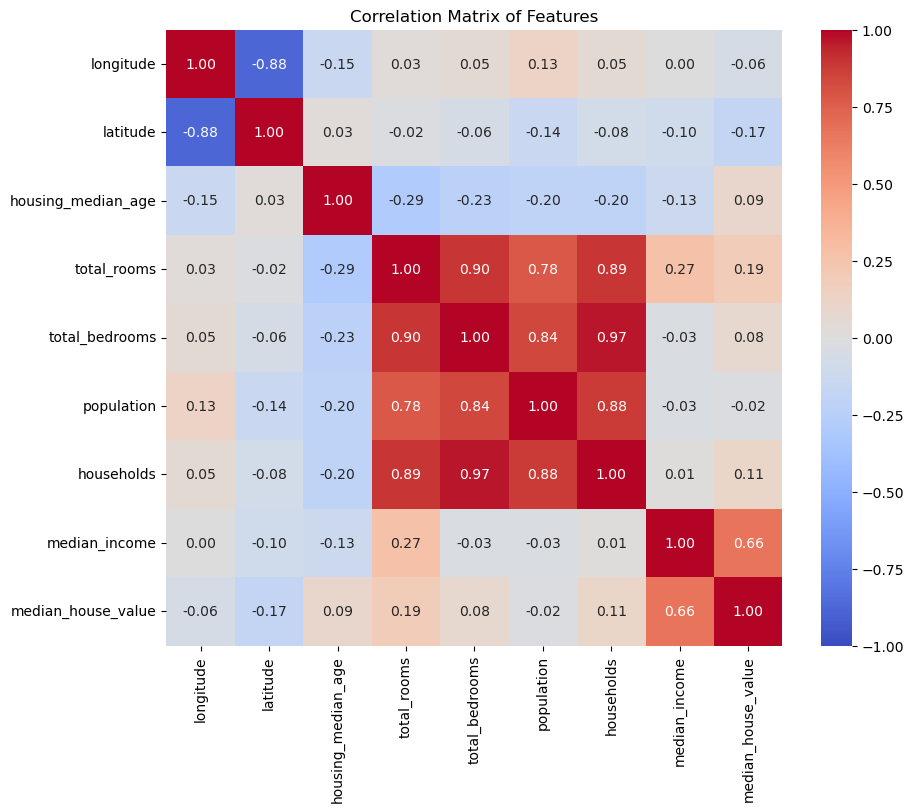

In [16]:
# EDA #2
# Correlation Matrix

# Calculate the correlation matrix (Utilisng Spearman due to most columns are Non-Paramteric in nature)
corr_matrix = df_c.corr(numeric_only=True, method='spearman')

# Print the correlation matrix
# print(corr_matrix)

# Set up matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap with the mask and correct aspect ratio (cmap='viridis')
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1, square=True).set_title('Correlation Matrix of Features')

# Descending correlation values of features against target (median_house_value)
display(corr_matrix['median_house_value'].sort_values(ascending=False))

plt.show()

* As you can see, "median_income" has the **highest correlation** value with our target variable (median_house_value). This shows that only specififc income bracnkets can access houses with specific set of prices. The higher your income, the more able you are buying a more expensive property, the higher chance of the transaction happening.

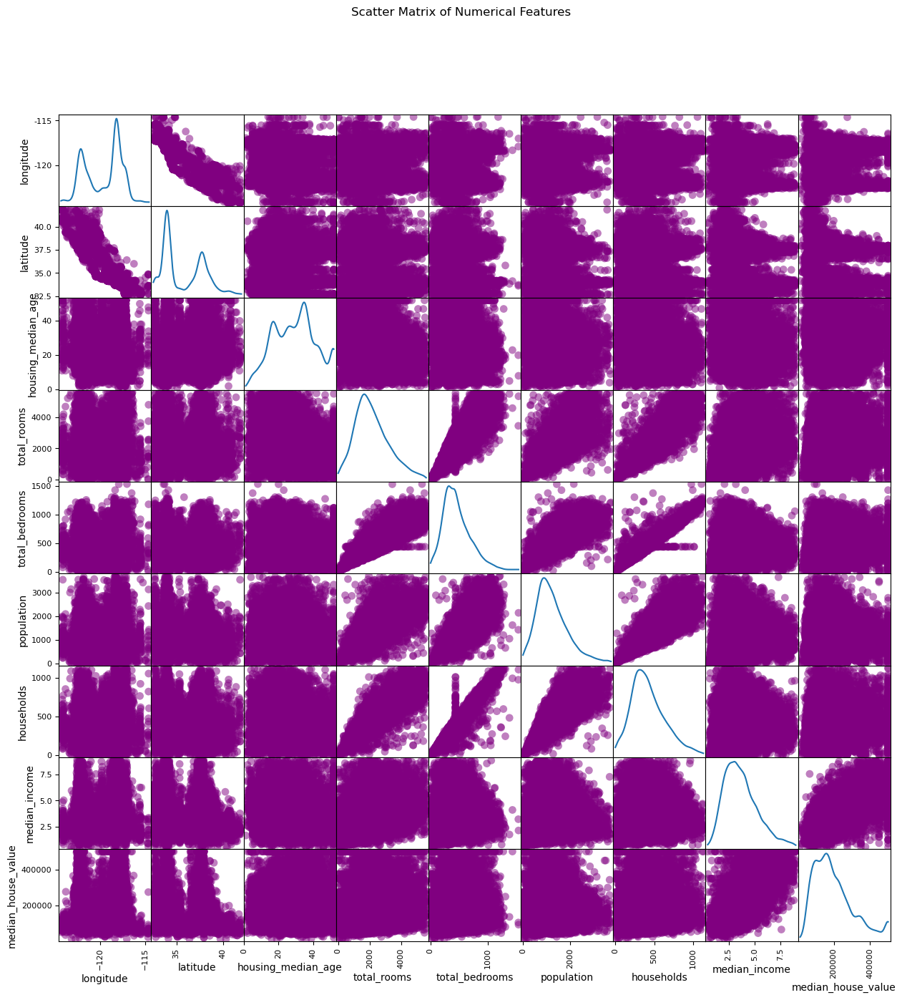

In [17]:
# [Optional] Convert ocean_proximity to a numerical code for coloring for ocean proximity based colouring
# df['ocean_proximity_code'] = df['ocean_proximity'].astype('category').cat.codes
# scatter_matrix(df[columns], figsize=(15, 15), alpha=0.5, marker='o', c=df['ocean_proximity_code'], cmap='viridis')

# Create the scatter matrix
scatter_matrix(df_c[num_columns], figsize=(15, 15), alpha=0.5, marker='o', hist_kwds={'bins': 30}, s=60, diagonal='kde', color='purple')
plt.suptitle('Scatter Matrix of Numerical Features')
plt.show()

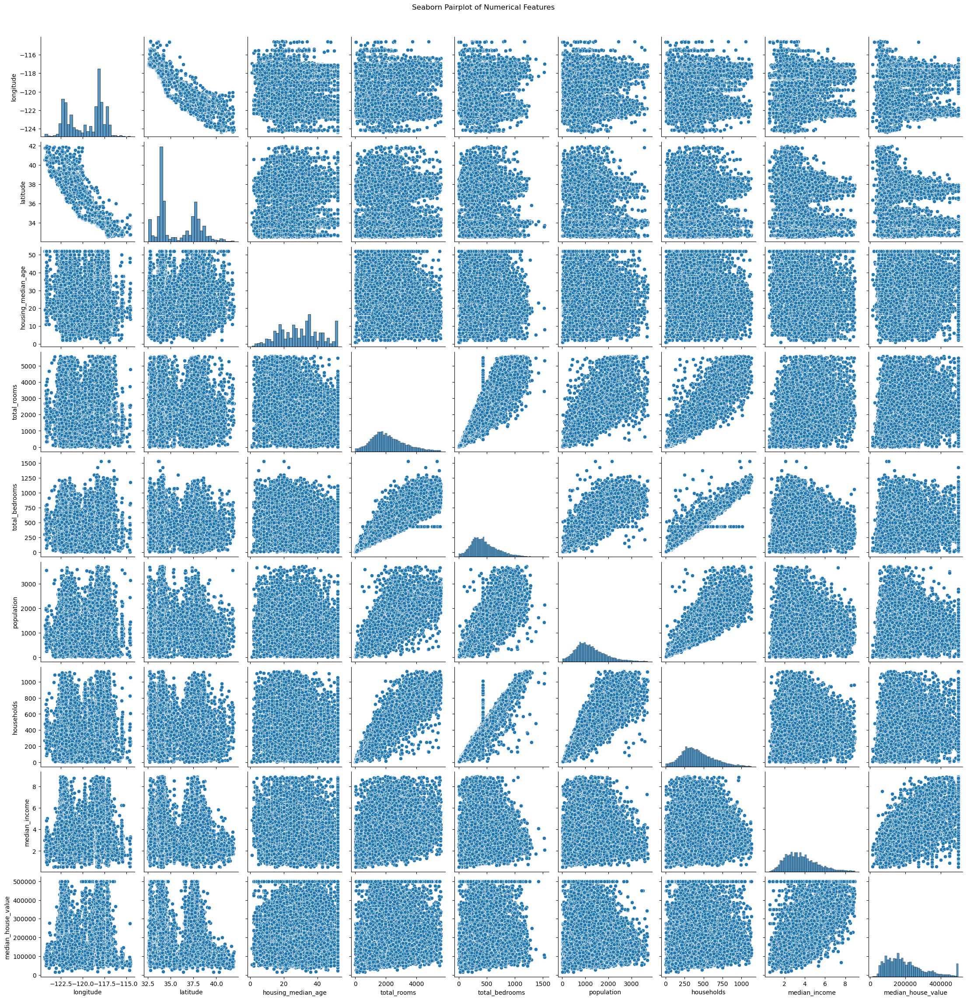

In [18]:
# Create the pairplot
sns.pairplot(df_c[num_columns])
plt.suptitle('Seaborn Pairplot of Numerical Features', y=1.02)
plt.show()

## Categorical Features Analysis (Post Data Preperation)

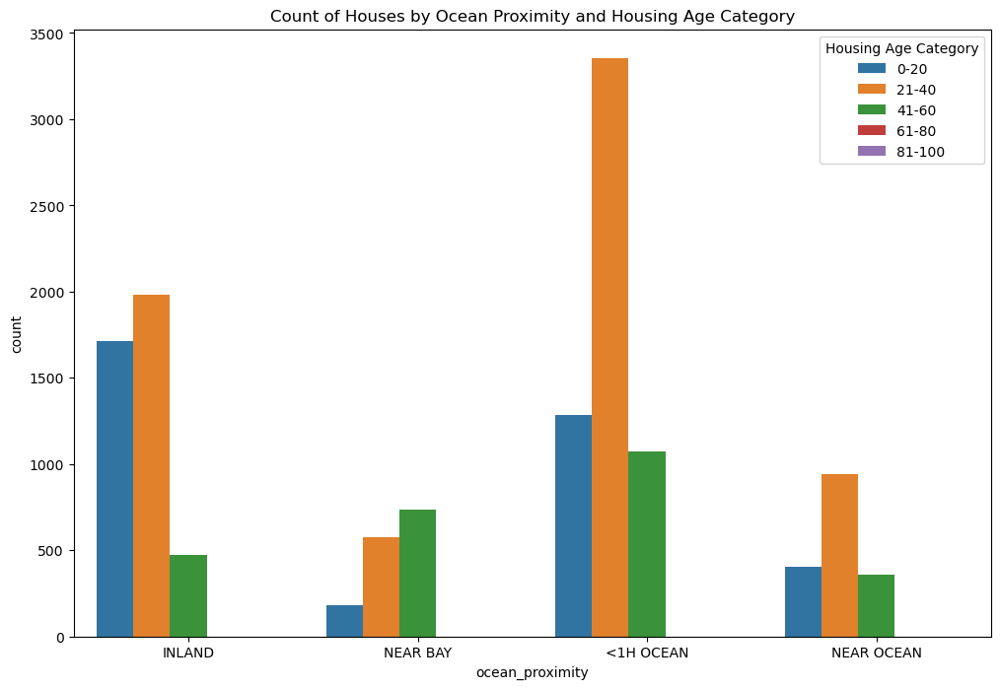

In [20]:
# Create an age category column for visualization (part of Feature Engineering)
df_c['age_category'] = pd.cut(df_c['housing_median_age'], bins=[0, 20, 40, 60, 80, 100], labels=['0-20', '21-40', '41-60', '61-80', '81-100'])

# Count plot with hue
plt.figure(figsize=(12, 8))
sns.countplot(x='ocean_proximity', hue='age_category', data=df_c)
plt.title('Count of Houses by Ocean Proximity and Housing Age Category')
# plt.xlabel('Ocean Proximity')
# plt.ylabel('Count')
plt.legend(title='Housing Age Category')
plt.show()

### Pivoting

* drawing insights from **aggregating column statistics** based on the only Categorical column available ("ocean_proximity") and finding **averages/mean** of the Numerical columns
* by making the **values** of the column **"ocean_proximity" as  column** and the **other Numerical columns as the rows**, all using the same index

In [21]:
# multi_agg_func ['mean', 'median', 'std']
pivot_mean = df_c.pivot_table(index='ocean_proximity', 
                                   values=num_columns, 
                                   aggfunc='mean' , 
                                   margins=True, 
                                   margins_name='Total'
                                   )
pivot_median = df_c.pivot_table(index='ocean_proximity', 
                                   values=num_columns, 
                                   aggfunc='median' , 
                                   margins=True, 
                                   margins_name='Total'
                                   )
pivot_std = df_c.pivot_table(index='ocean_proximity', 
                                   values=num_columns, 
                                   aggfunc='std' ,
                                   margins=True, 
                                   margins_name='Total'
                                   )
# sort by median_house_value (desc) + reset_index to convert as Dataframe
display("===== MEAN =====", pivot_mean.sort_values(by='median_house_value', ascending=False).reset_index())
display("===== MEDIAN =====", pivot_median.sort_values(by='median_house_value', ascending=False).reset_index())
display("===== STANDARD DEVIATION =====", pivot_std.sort_values(by='median_house_value', ascending=False).reset_index()) 

'===== MEAN ====='

,ocean_proximity,households,housing_median_age,latitude,longitude,median_house_value,median_income,population,total_bedrooms,total_rooms
0,NEAR BAY,425.404040,38.630303,37.807515,-122.261879,250085.317172,3.929970,1075.694949,449.078114,2147.156229
1,NEAR OCEAN,442.995880,30.169511,34.756521,-119.334526,239066.854032,3.741466,1180.331960,473.354915,2222.165980
2,<1H OCEAN,436.679460,30.235892,34.560624,-118.848563,230894.499299,4.007108,1301.011742,458.720645,2175.228531
3,Total,422.134053,29.593630,35.669195,-119.598628,199253.889221,3.678190,1208.505589,451.526183,2177.980937
4,INLAND,392.580777,25.264142,36.795930,-119.784068,121672.820470,3.112943,1140.732502,433.668265,2174.723394


'===== MEDIAN ====='

,ocean_proximity,households,housing_median_age,latitude,longitude,median_house_value,median_income,population,total_bedrooms,total_rooms
0,NEAR BAY,392.0,40.0,37.79,-122.26,225000.0,3.7262,1002.0,410.0,1991.0
1,NEAR OCEAN,417.0,30.0,33.79,-118.21,222600.0,3.5819,1085.0,441.0,2114.0
2,<1H OCEAN,402.0,32.0,34.02,-118.27,209250.0,3.8000,1187.0,422.0,1986.5
3,Total,390.0,30.0,34.28,-118.53,175000.0,3.4605,1108.0,417.0,2005.0
4,INLAND,364.0,24.0,37.10,-120.07,104300.0,2.9000,1049.5,401.0,1999.0


'===== STANDARD DEVIATION ====='

,ocean_proximity,households,housing_median_age,latitude,longitude,median_house_value,median_income,population,total_bedrooms,total_rooms
0,NEAR BAY,217.479465,12.664232,0.181383,0.145172,119583.411186,1.620291,546.665360,233.925938,1097.154597
1,NEAR OCEAN,211.880223,11.702163,2.337980,2.363803,116837.428874,1.539891,615.241200,229.173574,1095.217922
2,Total,211.629950,12.270080,2.156776,2.005407,109450.668911,1.565099,634.030065,228.631273,1107.827229
3,<1H OCEAN,207.568505,11.206159,1.475259,1.590676,98553.661830,1.610024,647.224962,224.473692,1070.338852
4,INLAND,211.820270,11.762198,2.105749,1.868853,68020.029424,1.316708,634.437602,230.928682,1165.494735


* As you can see, the Ocean can really drive the prices upawrds, as can be seen by the stark differences of the Mean (AVG) median_house_value for the "NEAR BAY", "NEAR OCEAN", "<1H OCEAN" is **MUCH HIGHER** than that of the "INLAND" median_house_value

## Analysis of Numerical Features Vs Target

* **Interpretation**

* The VIF values indicate the degree of multicollinearity for each feature. Variable with highly collinearity in the model, can affect the stability and interpretation of regression coefficients.. Generally:

    * A VIF value of 1 indicates no multicollinearity.
    * A VIF value between 1 and 5 indicates moderate multicollinearity.
    * A VIF value greater than 5 indicates high multicollinearity.

In [22]:
def calculate_vif(df):
    # Add a constant column for intercept
    X = sm.add_constant(df)

    # Create a DataFrame to store VIF values
    vif_data = pd.DataFrame()
    vif_data['Feature'] = X.columns

    # Calculate VIF for each feature
    vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return vif_data

In [23]:
# df['median_house_value'] as TARGET
vif_data = calculate_vif(df_c[['longitude',
 'latitude',
 'housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income'
 ]])
print(vif_data)

              Feature           VIF
0               const  17391.261536
1           longitude      9.212989
2            latitude      9.627340
3  housing_median_age      1.221507
4         total_rooms      9.040615
5      total_bedrooms     18.764874
6          population      3.989234
7          households     21.026633
8       median_income      2.140408


## Analysis of Categorical Features Vs Target

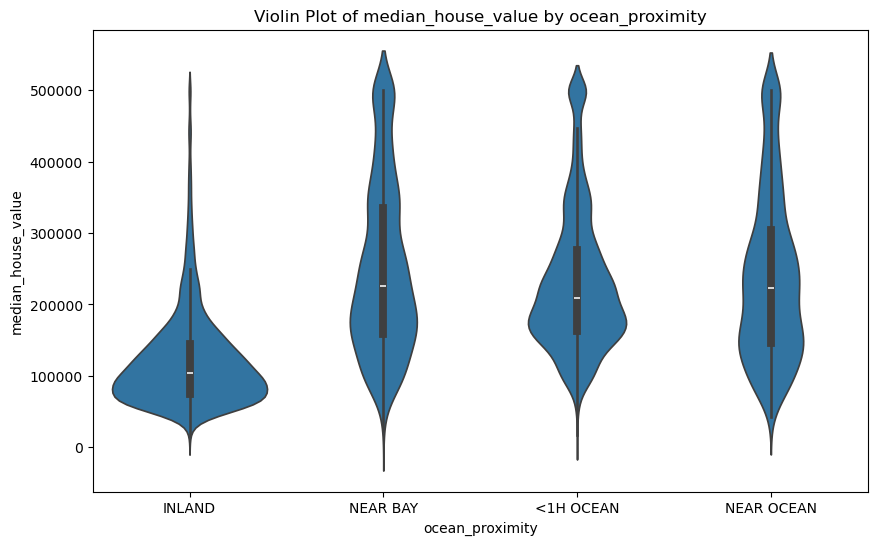

In [24]:
# Violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='ocean_proximity', y='median_house_value', data=df_c)
plt.title('Violin Plot of median_house_value by ocean_proximity')
plt.show()

In [25]:
# Summary statistics
categ_to_targ_summary = df_c.groupby('ocean_proximity')['median_house_value'].describe()
categ_to_targ_summary.reset_index(inplace=True)
categ_to_targ_summary

,ocean_proximity,count,mean,std,min,25%,50%,75%,max
0,<1H OCEAN,5706.0,230894.499299,98553.661830,17500.0,162300.0,209250.0,276575.0,500001.0
1,INLAND,4172.0,121672.820470,68020.029424,14999.0,75000.0,104300.0,144650.0,500001.0
2,NEAR BAY,1485.0,250085.317172,119583.411186,22500.0,158200.0,225000.0,335100.0,500001.0
3,NEAR OCEAN,1699.0,239066.854032,116837.428874,42500.0,145200.0,222600.0,304450.0,500001.0


<Figure size 2000x1500 with 0 Axes>

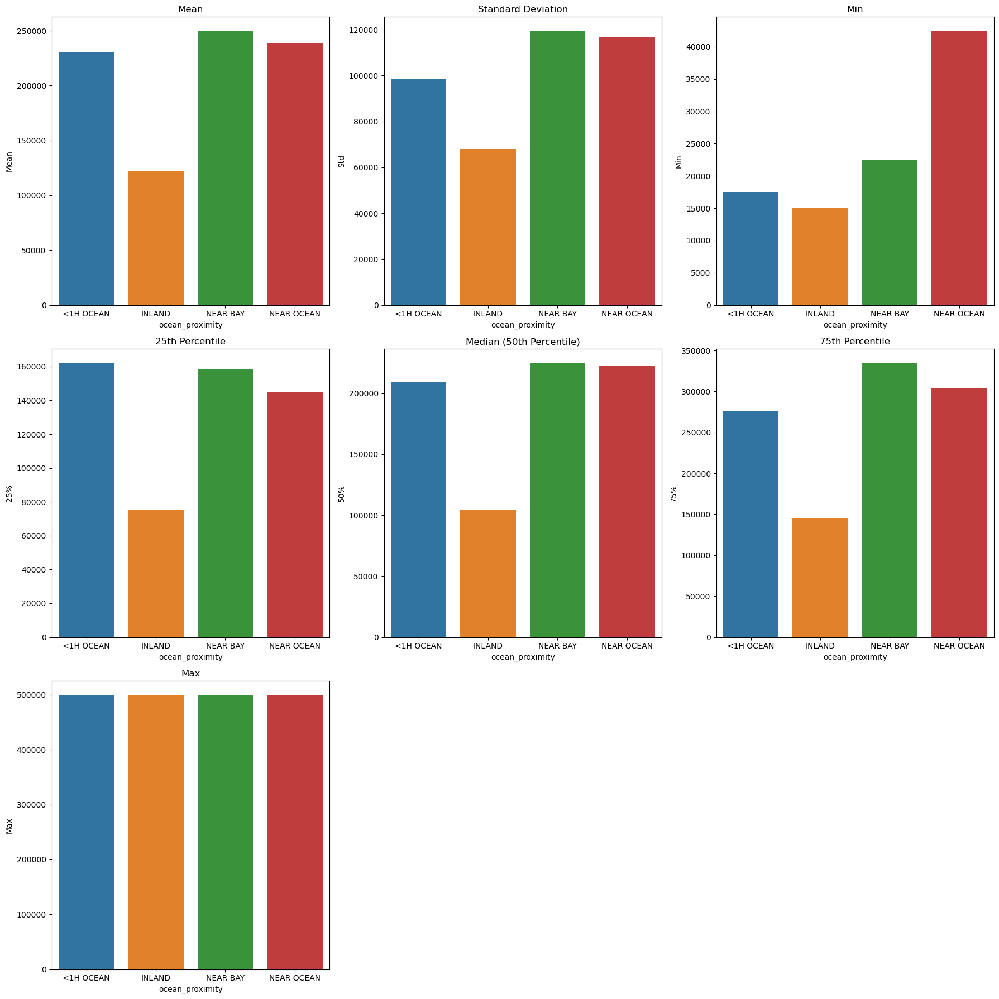

In [26]:
# Grouped bar plot with error bars

# Extract relevant statistics
summary_stats = categ_to_targ_summary[['ocean_proximity', 'mean', 'std', 'min', '25%', '50%', '75%', 'max']]

# Set the figure size for better readability
plt.figure(figsize=(20, 15))

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(18, 18))

# List of statistics to plot
stats = ['mean', 'std', 'min', '25%', '50%', '75%', 'max']
titles = ['Mean', 'Standard Deviation', 'Min', '25th Percentile', 'Median (50th Percentile)', '75th Percentile', 'Max']

# # Alternte Coloured Version
# # Generate a color palette
# palette = sns.color_palette("hsv", len(df['ocean_proximity'].unique()))
# # Plot each statistic
# for i, stat in enumerate(stats):
#     sns.barplot(x='ocean_proximity', y=stat, data=summary_stats, ax=axes[i//3, i%3], palette=palette)
#     axes[i//3, i%3].set_title(titles[i])
#     axes[i//3, i%3].set_ylabel(stat.capitalize())

# Plot each statistic
for i, stat in enumerate(stats):
    sns.barplot(x='ocean_proximity', y=stat, data=summary_stats, ax=axes[i//3, i%3], hue='ocean_proximity')
    axes[i//3, i%3].set_title(titles[i])
    axes[i//3, i%3].set_ylabel(stat.capitalize())

# Remove unused subplot axes
for j in range(i+1, 9):
    fig.delaxes(axes[j//3, j%3])

# Adjust layout
plt.tight_layout()
plt.show()

In [28]:
# Similarly to the earlier Histogram example (post-cleaning), the highest density for the 2 columns below are at their very last values, here are their distribution to better grasp the "anomalies"
display(
    df_c.groupby(by='median_house_value')['median_house_value'].count().sort_index(ascending=False).head(10),
    df_c.groupby(by='housing_median_age')['housing_median_age'].count().sort_index(ascending=False).head(10)
)

median_house_value
500001.0    404
500000.0     17
499100.0      1
499000.0      1
498700.0      1
497400.0      1
496400.0      2
496000.0      1
495900.0      1
495500.0      2
Name: median_house_value, dtype: int64

housing_median_age
52    855
51     34
50     94
49     91
48    107
47    128
46    170
45    185
44    250
43    238
Name: housing_median_age, dtype: int64

## Conclusion (EDA)

* 1. In "Scatter plot 1" supported by a map of California, it can be seen that the coordinate position near the **ocean** is actually along the **coast**
* 2. In "Scatter plot 2" you can see that the bulk properties with the **most expensive** prices are in the middle and bottom positions of the California map, but the 2 bulks are still in line with the initial conclusion, namely they are **located near the coast**.
* 3. In the "Heatmap correlation" it can be seen that the **highest correlation** with **median_house_value is median_income**, in "Scatter plot 3" although it is not clearly reflected, it can be seen that the **owners of the highest median income** are on average **spread** across the areas indicated by **point 2**
* 4. In the **Histogram plot (post-cleaning)** we can exclude the longitude and latitude graphs because the columns should be categorical but the data type must be **maintained** so that they can be **coordinate points**, the distribution of data that looks **Non-Parametric** a.k.a. not normally distributed can be seen in the median_house_value graph whereas it is **displaying outliers** as there are **more than 400** property with a price of **$500,001** (**max value** of median_house_value column) as well as housing_median_age where there are **more than 800 properties** that are **52 years old** (**max value** of housing_median_age column))

# 5. Data Preprocessing

## Target Data Proportion

* Initial Data Stats: 14,448 rows × 10 columns
* Post-Preperation (cleaning) Data Stats: 10,620 rows × 10 columns
* 80:20 Split (train : test/target)
* After Preprocessing: Train set (8,496 rows) * Test/Target (2,124 rows)

In [3]:
# Load Data (CLEANED)

df_c = pd.read_csv("data_california_house_cleaned.csv")
df_c

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52,112,28,193,40,1.9750,INLAND,47500.0
1,-122.21,37.77,43,1017,328,836,277,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17,2358,396,1387,364,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17,2518,1196,3051,1000,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50,772,194,606,167,2.2206,INLAND,59200.0
...,...,...,...,...,...,...,...,...,...,...
13057,-121.26,38.27,20,1314,229,712,219,4.4125,INLAND,144600.0
13058,-120.89,37.48,27,1118,195,647,209,2.9135,INLAND,159400.0
13059,-121.90,36.58,31,1431,435,704,393,3.1977,NEAR OCEAN,289300.0
13060,-117.93,33.62,34,2125,498,1052,468,5.6315,<1H OCEAN,484600.0


In [4]:
# Select a subset of "Numerical" columns (without "Target" Variable - "median_house_value")
num_columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']

In [43]:
# dropping column to convert back to original data
# df_c.drop(columns=['age_category'], inplace=True)

## Feature Engineering

* Feature Engineering is a process where we change the features in a dataset to improve model quality and improve the performance of ML algorithms. By creating new features or modifying existing ones, we aim to improve the performance of a machine learning model. It involves the transformation of raw data into meaningful features that better represent the underlying patterns to the model.

* We have added **2 new columns** by using the "Binning" data technique -> **converting numerical into categorical**

* Since there is only 1 categorical in the data set provided, to further expand the range of machine learning and make the analysis results more diverse, a new column was added to strengthen the regression model that will be created.

* **Additional Feature 1:** In Binning Median_Income, according to Internet Research there are 5 Income groups/categories in America according to the rules above, therefore, after looking at the graphical histogram so that it can be roughly divided into 5 categories, incomes from 1.0 to 5.0

* **Additional Feature 2:** After looking at the raw data again, although the correlation percentage is not too large, the data analyst sees the potential that housing_median_age can be binned to be used as an additional machine learning feature.

<Axes: >

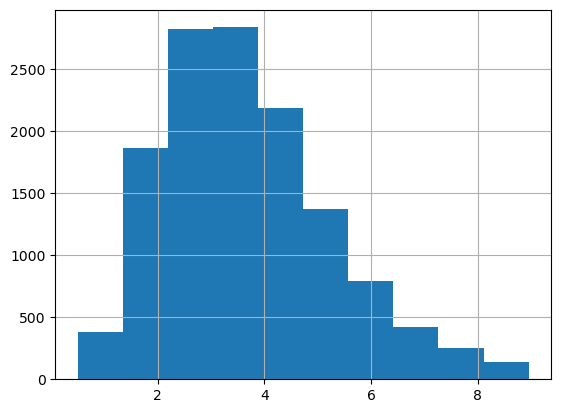

In [5]:
# Lets do Binning on "median_income" since it has the HIGHEST correlation with median_house_value
df_c['median_income'].hist()

* The creation of "income_cat" with rules as follows:<br>
    * 1.0 = Poor<br>
    * 2.0 = Lower-Middle Class<br>
    * 3.0 = Middle Class<br>
    * 4.0 = Upper-Middle Class<br>
    * 5.0 = Wealthy

In [6]:
# ===== Additional Feature 1 =====
bins = [-float('inf'),1.0,2.0,3.0,4.0,5.0,float('inf')] # min & max covered
labels=['Poor','Lower-Middle Class','Middle Class','Upper-Middle Class','Wealthy','Very Wealthy']

df_c['income_cat']=pd.cut(df_c['median_income'],bins=bins,labels=labels)
df_c['income_cat'].value_counts()

income_cat
Upper-Middle Class    3294
Middle Class          3292
Very Wealthy          2515
Wealthy               2322
Lower-Middle Class    1522
Poor                   117
Name: count, dtype: int64

<Axes: >

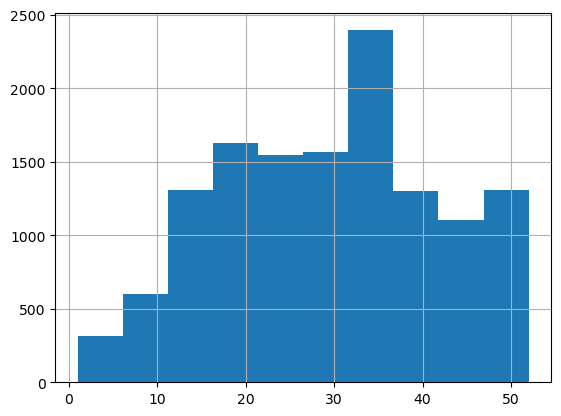

In [7]:
# Lets do Binning on "housing_median_age" since for INTERPRETABILITY & it also have a POSITIVE correlation with median_house_value
df_c['housing_median_age'].hist()

* The creation of "housingAge_cat" with rules as follows:<br>
    * 0-15 tahun = New
    * 16-25 tahun = Middle-Aged
    * 26-35 tahun = Old
    * 35-50 tahun = Prehistoric

In [8]:
# ===== Additional Feature 2 =====
bins = [-float('inf'),15,25,35,float('inf')] # min & max covered
labels=['New','Middle-Aged','Old','Prehistoric']

df_c['housingAge_cat']=pd.cut(df_c['housing_median_age'],bins=bins,labels=labels)
df_c['housingAge_cat'].value_counts()

housingAge_cat
Prehistoric    4271
Old            3801
Middle-Aged    3241
New            1749
Name: count, dtype: int64

In [11]:
# Save the DataFrame to a CSV file without the index
df_c.to_csv('data_california_house_cleaned_engineered.csv', index=False)

## Data Preprocessing
* This stage is cruicial so that the data is better represented, so that the model can understand the patterns in the data better. Here are the steps we will carry out:
1. Data Splitting
2. Handling Missing Values (Imputing)
3. Encoding
4. Resampling (less common for Regression problems)
5. Scaling

In [12]:
# Load Data (CLEANED & Engineered)

df_c = pd.read_csv("data_california_house_cleaned_engineered.csv")
df_c

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,income_cat,housingAge_cat
0,-119.79,36.73,52,112,28,193,40,1.9750,INLAND,47500.0,Lower-Middle Class,Prehistoric
1,-122.21,37.77,43,1017,328,836,277,2.2604,NEAR BAY,100000.0,Middle Class,Prehistoric
2,-118.04,33.87,17,2358,396,1387,364,6.2990,<1H OCEAN,285800.0,Very Wealthy,Middle-Aged
3,-118.28,34.06,17,2518,1196,3051,1000,1.7199,<1H OCEAN,175000.0,Lower-Middle Class,Middle-Aged
4,-119.81,36.73,50,772,194,606,167,2.2206,INLAND,59200.0,Middle Class,Prehistoric
...,...,...,...,...,...,...,...,...,...,...,...,...
13057,-121.26,38.27,20,1314,229,712,219,4.4125,INLAND,144600.0,Wealthy,Middle-Aged
13058,-120.89,37.48,27,1118,195,647,209,2.9135,INLAND,159400.0,Middle Class,Old
13059,-121.90,36.58,31,1431,435,704,393,3.1977,NEAR OCEAN,289300.0,Upper-Middle Class,Old
13060,-117.93,33.62,34,2125,498,1052,468,5.6315,<1H OCEAN,484600.0,Very Wealthy,Old


In [13]:
print(df_c.isna().sum())
# df_c.info()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
median_house_value    0
income_cat            0
housingAge_cat        0
dtype: int64


In [14]:
# ===== ACTION 1 =====
cat_columns_for_edit = ['income_cat','housingAge_cat']

# Modifying
for i in cat_columns_for_edit:
    df_c[i] = df_c[i].astype('object')

# Validating
df_c[['income_cat','housingAge_cat']].dtypes

income_cat        object
housingAge_cat    object
dtype: object

### Handling Missing Values (Imputing)

* For this stage, we are going to apply an imputer for both numerical and categorical features
* but we have **no Null values** -> Post-Cleaning

In [37]:
# Identify columns with missing values
# missing_num_columns = X_train.select_dtypes(include=['int64', 'float64']).columns[X_train.isnull().any()].tolist()
# missing_cat_columns = X_train.select_dtypes(include=['object']).columns[X_train.isnull().any()].tolist()

# # Impute missing values with the mean for numerical columns
# num_imputer = SimpleImputer(strategy='mean')
# X_train[missing_num_columns] = num_imputer.fit_transform(X_train[missing_num_columns])
# X_test[missing_num_columns] = num_imputer.transform(X_test[missing_num_columns])

# # Impute missing values with the mean for categorical columns
# cat_imputer = SimpleImputer(strategy='most_frequent', fill_value='missing')
# X_train[missing_cat_columns] = cat_imputer.fit_transform(X_train[missing_cat_columns])
# X_test[missing_cat_columns] = cat_imputer.transform(X_test[missing_cat_columns])

### Encoding

* At this stage we will change/encode the categorical data type to numeric so that it can become a feature in Machine Learning.
    * **OneHot Encoding:** We will use OneHot in the **ocean_proximity** column, because it only contains 4 values. We assume the type of each **ocean_proximity** categories have the same weight a.k.a. no different than one another (nominal variable)

### Scaling 

* Scaling is a method for carrying out transformations on numerical data so that variables (features) have the same scale. We will perform Scaling (change the scale) on all numerical data so that it has similar or equivalent values. We are also scaling the YearBuilt column, because we see the correlation that YearBuilt and SalePrice have a linear relationship.
* The scaling method we use is Robust Scaler. We chose this method because when we look at the distribution of data in the Size column above, the data still has outliers. **Robust Scaler is suitable for use because it is not sensitive to data outliers**. The way the Robust Scaler works is by subtracting the data from the value of quartile 1 and then dividing it by the difference between quartile 3 and quartile 1. Here is the formula:

### Resampling

* For **regression** problems, **resampling is less common** compared to classification problems. However, if needed, techniques like SMOTE for regression or other oversampling methods can be used. For this example, we'll **skip** this step.

In [38]:
# mapping for ordinal encoder (cannot decide if 'income_cat' & 'housingAge_cat' can be assigned an ordinal score)
# need more domain knowledge
# ordinal_encoding = [{'col':'income_cat',
#                      'mapping':{'no_bus_stop_nearby':1, 
#                                 '15-20min':2, 
#                                 '10-15min':3, 
#                                 '5-10min':4,
#                                 '0-5min':5}}]

In [18]:
# Encoding & Scaling

# Define the column names (9 numerical & 3 categorical)
numerical_features = [
    'longitude',
    'latitude',
    'housing_median_age',
    'total_rooms',
    'total_bedrooms',
    'population',
    'households',
    'median_income'
]
categorical_features = ['ocean_proximity', 'income_cat','housingAge_cat']

# Define the transformers for numerical and categorical features
numerical_transformer = RobustScaler()
categorical_transformer = OneHotEncoder(drop='first')

# Create the ColumnTransformer
transformer = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ], remainder='passthrough' # (all columns will be transformed)
)

transformer

# Fit and transform the data (fitting later on)
# df_transformed = transformer.fit_transform(df)

ColumnTransformer(remainder='passthrough',
                  transformers=[('num', RobustScaler(),
                                 ['longitude', 'latitude', 'housing_median_age',
                                  'total_rooms', 'total_bedrooms', 'population',
                                  'households', 'median_income']),
                                ('cat', OneHotEncoder(drop='first'),
                                 ['ocean_proximity', 'income_cat',
                                  'housingAge_cat'])])

In [19]:
categorical_features

['ocean_proximity', 'income_cat', 'housingAge_cat']

In [20]:
numerical_features

['longitude',
 'latitude',
 'housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income']

### Data Splitting

* We use the **80:20 train test split** since our data is **not that large** , this split ration **ensures** that we have **enough** data to **train** the model while still having a **representative test** set (large enough for reliable evaluation).

In [21]:
# Separate features (independent var) and target variable (dependent var)
X = df_c.drop('median_house_value', axis=1) # include all except target
y = df_c['median_house_value'] # target

# Perform a train-test split (80-20 split) -> "no stratify = y" since it is not a Classification problem
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Feature Selection

* For this **process**, we can make adjustments to the data in the form of deleting rows or adding columns to increase accuracy in the model
* **Deleting (Selection):** which we already did by deleting rows/columns that have little impact on the ML Model. (e.g. when we delete the value "ISLAND" from the categorical feature "ocean_proximity")
* **Adding (Engineering):** which we already did through Feature Engineering. We have added 2 new columns by using the "Binning" data technique -> converting numerical into categorical

## Pipelining

* **Combine all Data Preprocessing Steps** for all the featrues that we have
* will be part of the **Modelling code snippet** under **estimator**

# 6. Modelling

In [51]:
# Import library for Modelling
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV, StratifiedKFold

import category_encoders as ce
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.compose import TransformedTargetRegressor

from sklearn.preprocessing import StandardScaler

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

## Linear Models (6 chosen)

* lr = LinearRegression()
* knn = KNeighborsRegressor()
* dt = DecisionTreeRegressor(random_state=42)
* rf = RandomForestRegressor(random_state=42)
* xgb = XGBRegressor(random_state=42)
* ada = AdaBoostRegressor(random_state=42)

### Cross-Validation

* At this stage, we will divide the training data into several parts. The process carried out in CrossValidation is to generalize repeatedly in turns, then combine the results. This aims to ensure that we can get a stable model. We will choose a model that is stable and has good results (small RMSE, MAE, and MAPE) as a model for building Machine Learning.

* We will divide the training data into 5 parts for cross validation. We will loop several regression models at once and use RMSE, MAE and MAPE matrix evaluations to see what model is best for our data.

In [68]:
# # XtremeGradientBoost
# xgb_model = XGBRegressor(random_state=42)

# xgb_model = Pipeline([
#     ('preprocessing', transformer),
#     # ('scaler', scaler), # inside transformer
#     ('model', xgb_model)
# ])
# xgb_model.fit(X_train, y_train)
# y_pred = xgb_model.predict(X_test)


In [69]:
# Define algoritma yang digunakan
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=42)
rf = RandomForestRegressor(random_state=42)
xgb = XGBRegressor(random_state=42)
ada = AdaBoostRegressor(random_state=42)

# Pemodelan dilakukan dalam skala logaritmik, namun kemudian di-inverse kembali untuk interpretasi
log_lr = TransformedTargetRegressor(lr, func=np.log, inverse_func=np.exp)
log_knn = TransformedTargetRegressor(knn, func=np.log, inverse_func=np.exp)
log_dt = TransformedTargetRegressor(dt, func=np.log, inverse_func=np.exp)
log_rf = TransformedTargetRegressor(rf, func=np.log, inverse_func=np.exp)
log_xgb = TransformedTargetRegressor(xgb, func=np.log, inverse_func=np.exp)
log_ada = TransformedTargetRegressor(ada, func=np.log, inverse_func=np.exp)

# Data Scaling (using RobustScaler -> inside Transformer)

# Algorithm Candidates
models = [log_lr, log_knn, log_dt, log_rf, log_xgb, log_ada]
# models = [lr, knn, dt, rf, xgb, ada]

# Score Storage
score_rmse = []
nilai_mean_rmse = []
nilai_std_rmse = []

score_mae = []
nilai_mean_mae = []
nilai_std_mae = []

score_mape = []
nilai_mean_mape = []
nilai_std_mape = []

# Finding best Algorihtms through Cross-Validation (5 splits)
for i in models:
    
    # Cross-Validation
    crossval = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Pipeline
    estimator = Pipeline([
        ('preprocessing', transformer),
        # ('scaler', scaler), # inside transformer
        ('model', i)
    ])

    # ===== RMSE =====
    model_cv_rmse = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_root_mean_squared_error', 
        error_score='raise'
        )
    print(model_cv_rmse, i)

    score_rmse.append(model_cv_rmse)
    nilai_mean_rmse.append(model_cv_rmse.mean())
    nilai_std_rmse.append(model_cv_rmse.std())

    # # ===== MAE =====
    model_cv_mae = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_error', 
        error_score='raise'
        )
    # print(model_cv_mae, i)

    score_mae.append(model_cv_mae)
    nilai_mean_mae.append(model_cv_mae.mean())
    nilai_std_mae.append(model_cv_mae.std())

    # # ===== MAPE =====
    model_cv_mape = cross_val_score(
        estimator, 
        X_train, 
        y_train, 
        cv=crossval, 
        scoring='neg_mean_absolute_percentage_error', 
        error_score='raise'
        )
    print(model_cv_mape, i)

    score_mape.append(model_cv_mape)
    nilai_mean_mape.append(model_cv_mape.mean())
    nilai_std_mape.append(model_cv_mape.std())

[-62705.82525066 -69516.68278888 -66217.20900904 -64592.57583821
 -65603.97391407] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=LinearRegression())
[-0.23411031 -0.24820533 -0.25037273 -0.25301906 -0.24866012] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=LinearRegression())


[-64711.30233005 -68166.40050156 -65287.74826209 -63964.53596065
 -66783.30122333] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=KNeighborsRegressor())
[-0.22863111 -0.24140499 -0.2509868  -0.24455695 -0.23965656] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=KNeighborsRegressor())
[-72756.57126108 -69798.01698243 -72978.77066562 -68915.82589505
 -70460.91841906] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=DecisionTreeRegressor(random_state=42))
[-0.25467621 -0.24519249 -0.26787237 -0.26087053 -0.25180394] TransformedTargetRegressor(func=<ufunc 'log'>, inverse_func=<ufunc 'exp'>,
                           regressor=DecisionTreeRegressor(random_state=42))
[-49736.46655608 -55933.39707168 -50841.20320069 -50281.49566219
 -52244.79385045] TransformedTargetRegressor(func=<ufunc 'log'>, invers

## Non-Linear Models

### Cross-Validation

# 7. Evaluation

## All Models Performance Comparison

In [70]:
# Evaluasi of the 6 Algorithms used
model_evaluasi = pd.DataFrame({
    'Model': ['Linear Regression', 'KNeighbors Regressor','DecisionTree Regressor', 'RandomForest Regressor', 'XGBoost Regressor', 'AdaBoost Regressor'],
    'Mean_RMSE': nilai_mean_rmse,
    'Std_RMSE': nilai_std_rmse,
    'Mean_MAE': nilai_mean_mae,
    'Std_MAE': nilai_std_mae,
    'Mean_MAPE': nilai_mean_mape,
    'Std_MAPE': nilai_std_mape
})

model_evaluasi.sort_values('Mean_MAE', ascending=False)

,Model,Mean_RMSE,Std_RMSE,Mean_MAE,Std_MAE,Mean_MAPE,Std_MAPE
4,XGBoost Regressor,-50066.424373,1859.979024,-32294.331866,998.105134,-0.173223,0.005861
3,RandomForest Regressor,-51807.471268,2225.571874,-33234.812718,1187.545615,-0.177691,0.006507
1,KNeighbors Regressor,-65782.657656,1508.762509,-44808.665564,813.440243,-0.241047,0.007312
0,Linear Regression,-65727.253360,2237.478521,-45291.018441,1024.202461,-0.246874,0.006601
2,DecisionTree Regressor,-70982.020645,1617.319602,-45989.397860,345.155177,-0.256083,0.007756
5,AdaBoost Regressor,-79337.365972,2162.807375,-55891.735209,1243.718944,-0.303521,0.005788


* Models Chosen
    * 1. XGBRegressor
    * 2. RandomForestRegressor

In [73]:
models = {
    'XGB': XGBRegressor(random_state=42),
    'RandomForest': RandomForestRegressor(random_state=42)
}

score_rmse = []
score_mae = []
score_mape = []

# Prediction on Test Set
for i in models:

    model = Pipeline([
        ('preprocessing', transformer),
        ('model', models[i])
        ])

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score_rmse.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    score_mae.append(mean_absolute_error(y_test, y_pred))
    score_mape.append(mean_absolute_percentage_error(y_test, y_pred))

score_before_tuning = pd.DataFrame({'RMSE': score_rmse, 'MAE': score_mae, 'MAPE': score_mape}, index=models.keys())
# MAE not sensitive to Outliers
score_before_tuning.sort_values('MAE', ascending=True)

,RMSE,MAE,MAPE
XGB,51063.171154,33056.964026,0.179280
RandomForest,52271.206930,33727.894367,0.183943


# 8. Hyperparameter Tuning: Best Model Selection

## Model Before Tuning: Specification of Model

In [74]:
# XGBoost ahs lower MAE values (the closer to 0 the better)
score_before_tuning.sort_values('MAE', ascending=True)

,RMSE,MAE,MAPE
XGB,51063.171154,33056.964026,0.179280
RandomForest,52271.206930,33727.894367,0.183943


## Hyperparameter Tuning with RandomizedSearchCV

* Models Chosen
    * 1. XGBRegressor
    * 2. RandomForestRegressor

### Hyperparameter Tuning (XGBRegressor)

In [75]:
# ===== Hyperparam Space =====

# Tree Depth
max_depth = list(np.arange(1, 11))
# Learning rate
learning_rate = list(np.arange(1, 100)/100)
# Jumlah pohon
n_estimators = list(np.arange(100, 201))
# Jumlah baris tiap pohon (% dari total baris train set)
subsample = list(np.arange(2, 10)/10)
# Gamma (min_impurity_decrease)
gamma = list(np.arange(1, 11)) # Semakin besar nilainya, semakin konservatif/simpel modelnya
# Jumlah feature yang digunakan untuk tiap pohon (% dari total kolom train set)
colsample_bytree = list(np.arange(1, 10)/10)
# Alpha (regularization)
reg_alpha = list(np.logspace(-3, 1, 10)) # Semakin besar nilainya, semakin konservatif/simpel modelnya

# Hyperparam space XGboost
hyperparam_space_xgb = {
    'model__max_depth': max_depth, 
    'model__learning_rate': learning_rate,
    'model__n_estimators': n_estimators,
    'model__subsample': subsample,
    'model__gamma': gamma,
    'model__colsample_bytree': colsample_bytree,
    'model__reg_alpha': reg_alpha
}

In [76]:
# Benchmark model dengan hyperparameter tuning
xgb = XGBRegressor(random_state=42, verbosity=0)

# Membuat algorithm chains
estimator_xgb = Pipeline([
        ('preprocessing', transformer),
        ('model', xgb)
        ])

crossval = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Hyperparameter tuning
random_xgb = RandomizedSearchCV(
    estimator_xgb, 
    param_distributions = hyperparam_space_xgb,
    n_iter = 50,
    cv = crossval, 
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_mean_absolute_error', # Hanya bisa memilih salah stau metric untuk optimisasi
    random_state = 42 
)

In [77]:
# Fitting data training untuk mencari parameter terbaik
random_xgb.fit(X_train, y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               RobustScaler(),
                                                                               ['longitude',
                                                                                'latitude',
                                                                                'housing_median_age',
                                                                                'total_rooms',
                                                                                'total_bedrooms',
                                                                                'population',
                                                                                'households',
                                                                                'median_income']),
                                                                              ('cat',
                                                                               OneHotEncoder(drop='fir...
                                                             0.0027825594022071257,
                                                             0.007742636826811269,
                                                             0.021544346900318832,
                                                             0.05994842503189409,
                                                             0.1668100537200059,
                                                             0.46415888336127775,
                                                             1.2915496650148828,
                                                             3.593813663804626,
                                                             10.0],
                                        'model__subsample': [0.2, 0.3, 0.4, 0.5,
                                                             0.6, 0.7, 0.8,
                                                             0.9]},
                   random_state=42, refit='neg_mean_absolute_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [ ]:
# Melihat hasil tuning dalam bentuk dataframe. Diurutkan berdasarkan RMSE, MAE & MAPE
# pd.DataFrame(random_xgb.cv_results_).sort_values(by=['rank_test_neg_root_mean_squared_error', 'rank_test_neg_mean_absolute_error', 'rank_test_neg_mean_absolute_percentage_error']).head()

In [78]:
# Cek skor dan params terbaik
print('XGBoost')
print('Best_score:', random_xgb.best_score_)
print('Best_params:', random_xgb.best_params_)

XGBoost
Best_score: -32976.96956977094
Best_params: {'model__subsample': 0.6, 'model__reg_alpha': 0.05994842503189409, 'model__n_estimators': 141, 'model__max_depth': 10, 'model__learning_rate': 0.03, 'model__gamma': 10, 'model__colsample_bytree': 0.6}


### Hyperparameter Tuning (RandomForestRegressor)

In [79]:
# ===== Hyperparam Space =====

# Jumlah pohon pada random forest
n_estimators = list(np.arange(100,201))
# Jumlah fitur yang perlu dipertimbangkan di setiap split
max_features = list(np.arange(2,11))
# kedalaman pohon
max_depth = list(np.arange(1,11))
# Jumlah minimum sampel yang diperlukan untuk split sebuah node
min_sample_split = list(np.arange(2,21))
# Jumlah minumum sampel yang diperlukan pada setiap leaf
min_samples_leaf = list(np.arange(1,21))

hyperparam_space_rf= {
    'model__n_estimators': n_estimators,
    'model__max_features' : max_features,
    'model__max_depth': max_depth,
    'model__min_samples_split' : min_sample_split,
    'model__min_samples_leaf' : min_samples_leaf,
}

In [80]:
# Random Forest dengan hyperparameter tuning
rf = RandomForestRegressor(random_state=42)

# Membuat algorithm chains
estimator_rf = Pipeline([
        ('preprocessing', transformer),
        ('model', rf)
        ])

crossval = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Hyperparameter tuning
random_rf = RandomizedSearchCV(
    estimator_rf, 
    param_distributions = hyperparam_space_rf,
    n_iter = 100,
    cv = crossval, 
    scoring = ['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'], 
    n_jobs = -1,
    refit = 'neg_mean_absolute_error', # Hanya bisa memilih salah stau metric untuk optimisasi
    random_state = 42
)

In [81]:
random_rf.fit(X_train,y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               RobustScaler(),
                                                                               ['longitude',
                                                                                'latitude',
                                                                                'housing_median_age',
                                                                                'total_rooms',
                                                                                'total_bedrooms',
                                                                                'population',
                                                                                'households',
                                                                                'median_income']),
                                                                              ('cat',
                                                                               OneHotEncoder(drop='fir...
                                        'model__min_samples_split': [2, 3, 4, 5,
                                                                     6, 7, 8, 9,
                                                                     10, 11, 12,
                                                                     13, 14, 15,
                                                                     16, 17, 18,
                                                                     19, 20],
                                        'model__n_estimators': [100, 101, 102,
                                                                103, 104, 105,
                                                                106, 107, 108,
                                                                109, 110, 111,
                                                                112, 113, 114,
                                                                115, 116, 117,
                                                                118, 119, 120,
                                                                121, 122, 123,
                                                                124, 125, 126,
                                                                127, 128, 129, ...]},
                   random_state=42, refit='neg_mean_absolute_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [82]:
# Cek skor dan params terbaik
print('RandomForest')
print('Best_score:', random_rf.best_score_)
print('Best_params:', random_rf.best_params_)

RandomForest
Best_score: -38557.88071482908
Best_params: {'model__n_estimators': 136, 'model__min_samples_split': 10, 'model__min_samples_leaf': 1, 'model__max_features': 10, 'model__max_depth': 10}


## Model Fitting (with Best Estimator -> Post Hyperparam Tuning)

In [83]:
# ===== Model XGBoost =====
model = {'XGB': XGBRegressor(random_state=1)}

# Define model terhadap estimator terbaik
xgb_tuning = random_xgb.best_estimator_

# Fitting model
xgb_tuning.fit(X_train, y_train)

# Predict test set
y_pred_xgb_tuning = xgb_tuning.predict(X_test)

# Simpan nilai metrics RMSE, MAE & MAPE setelah tuning
rmse_xgb_tuning = np.sqrt(mean_squared_error(y_test, y_pred_xgb_tuning))
mae_xgb_tuning = mean_absolute_error(y_test, y_pred_xgb_tuning)
mape_xgb_tuning = mean_absolute_percentage_error(y_test, y_pred_xgb_tuning)

XGB_score_after_tuning = pd.DataFrame({'RMSE': rmse_xgb_tuning, 'MAE': mae_xgb_tuning, 'MAPE': mape_xgb_tuning}, index=model.keys())
XGB_score_after_tuning

,RMSE,MAE,MAPE
XGB,50614.250928,32836.158274,0.184045


In [84]:
# ===== Model Random Forest =====
model = {'RandomForest': RandomForestRegressor(random_state=1)}

# Define model terhadap estimator terbaik
rf_tuning = random_rf.best_estimator_

# Fitting model
rf_tuning.fit(X_train, y_train)

# Predict test set
y_pred_rf_tuning = rf_tuning.predict(X_test)

# Simpan nilai metrics RMSE, MAE & MAPE setelah tuning
rmse_rf_tuning = np.sqrt(mean_squared_error(y_test, y_pred_rf_tuning))
mae_rf_tuning = mean_absolute_error(y_test, y_pred_rf_tuning)
mape_rf_tuning = mean_absolute_percentage_error(y_test, y_pred_rf_tuning)

RF_score_after_tuning = pd.DataFrame({'RMSE': rmse_rf_tuning, 'MAE': mae_rf_tuning, 'MAPE': mape_rf_tuning}, index=model.keys())
RF_score_after_tuning

,RMSE,MAE,MAPE
RandomForest,57354.054421,38673.196265,0.213366


## Model Performance Comparison (Before and After Tuning)

* After Hyperparam Tuning **focusing** (refitting/optimising) on **MAE** score:
    * 1. XGBoost got a MAE **improvement** from 33056.964026 -> 32836.158274
    * 2. Random Forest got a MAE score **reduction** from 33727.894367 -> 38673.196265

### Before/After Tuning (XGBoost)

In [85]:
display(pd.DataFrame(score_before_tuning.loc['XGB']).T,XGB_score_after_tuning)

,RMSE,MAE,MAPE
XGB,51063.171154,33056.964026,0.17928


,RMSE,MAE,MAPE
XGB,50614.250928,32836.158274,0.184045


### Before/After Tuning (Random Forest)

In [86]:
display(pd.DataFrame(score_before_tuning.loc['RandomForest']).T,RF_score_after_tuning)

,RMSE,MAE,MAPE
RandomForest,52271.20693,33727.894367,0.183943


,RMSE,MAE,MAPE
RandomForest,57354.054421,38673.196265,0.213366


# 9. Final Model Interpretation & Saving

In [2]:
# Load Data (CLEANED + Feature Engineered)

df_c = pd.read_csv("data_california_house_cleaned.csv")
df_c

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-119.79,36.73,52,112,28,193,40,1.9750,INLAND,47500.0
1,-122.21,37.77,43,1017,328,836,277,2.2604,NEAR BAY,100000.0
2,-118.04,33.87,17,2358,396,1387,364,6.2990,<1H OCEAN,285800.0
3,-118.28,34.06,17,2518,1196,3051,1000,1.7199,<1H OCEAN,175000.0
4,-119.81,36.73,50,772,194,606,167,2.2206,INLAND,59200.0
...,...,...,...,...,...,...,...,...,...,...
13057,-121.26,38.27,20,1314,229,712,219,4.4125,INLAND,144600.0
13058,-120.89,37.48,27,1118,195,647,209,2.9135,INLAND,159400.0
13059,-121.90,36.58,31,1431,435,704,393,3.1977,NEAR OCEAN,289300.0
13060,-117.93,33.62,34,2125,498,1052,468,5.6315,<1H OCEAN,484600.0


## Final Model

* XGBoost (best post-param tuning)
    * 1. RMSE: 50614.250928
    * 2. MAE: 32836.158274
    * 3. MAPE: 0.184045

## Model Interpretation

### Explainable ML

[Text(0.5, 0, 'median_house_value'),
 Text(0, 0.5, 'residual'),
 Text(0.5, 1.0, 'Residual value')]

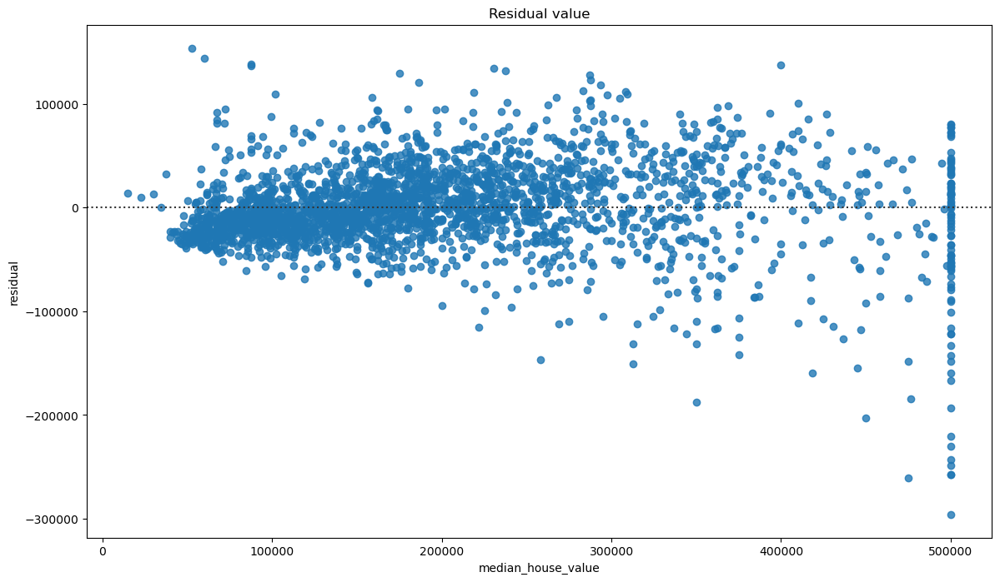

In [87]:
plt.figure(figsize=(14, 8))
sns.residplot(x=y_test, y=y_pred_xgb_tuning).set(xlabel='median_house_value', ylabel='residual',title = 'Residual value')

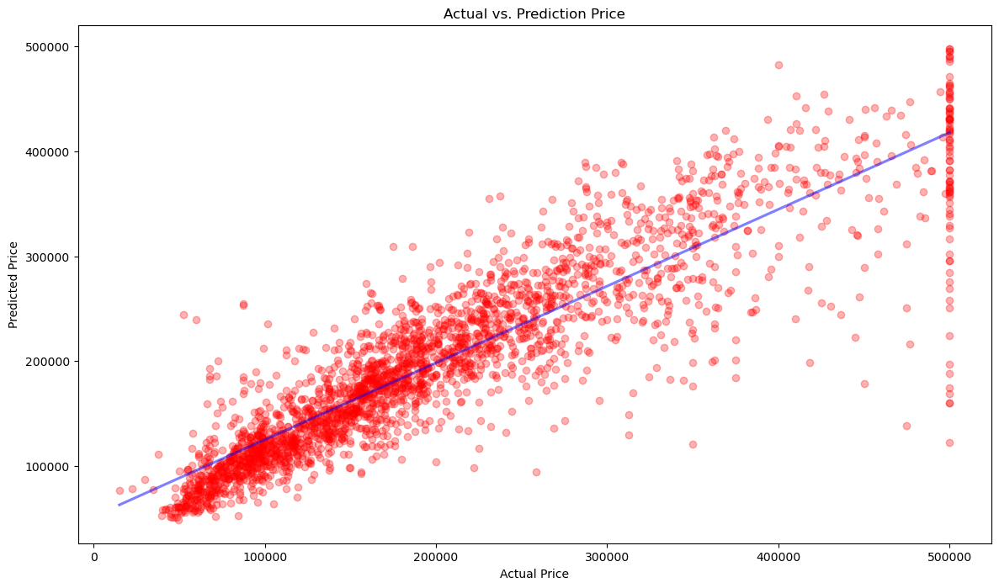

In [88]:
plt.figure(figsize=(14, 8))
sns.regplot(x=y_test, y=y_pred_xgb_tuning, ci=None, scatter_kws = {'color': 'red', 'alpha': 0.3}, line_kws = {'color': 'blue', 'alpha': 0.5}).set(title='Actual vs. Prediction Price',
                                               xlabel='Actual Price',
                                               ylabel='Predicted Price')
plt.show()

### Feature Importance

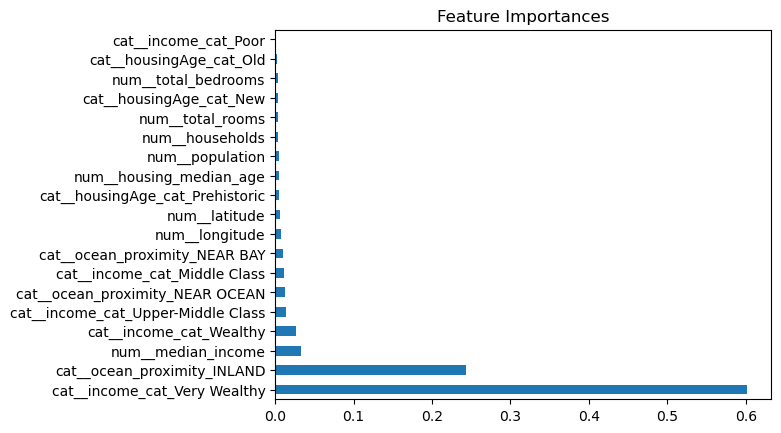

In [89]:
# Plot feature importances
feature_imp = pd.Series(xgb_tuning['model'].feature_importances_, transformer.get_feature_names_out()).sort_values(ascending = False)
feature_imp.plot(kind='barh', title='Feature Importances');

### Confusion Matrix

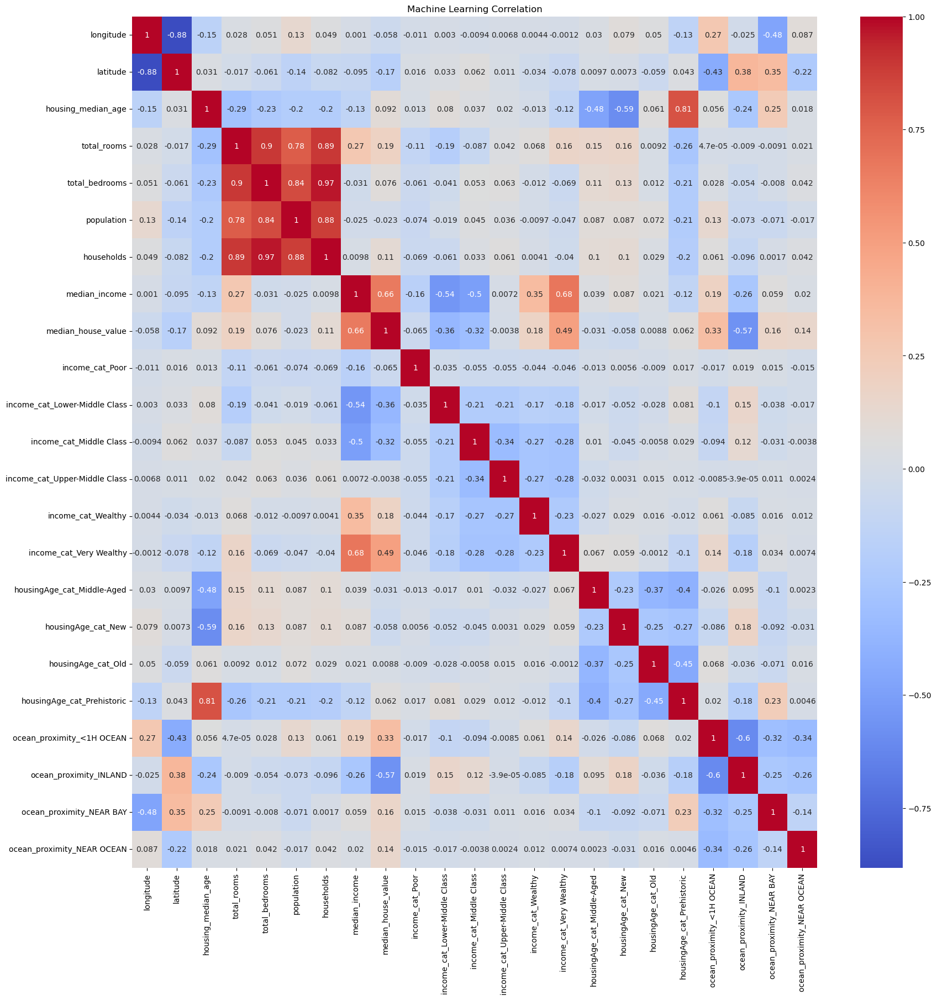

median_house_value               1.000000
median_income                    0.664302
income_cat_Very Wealthy          0.494917
ocean_proximity_<1H OCEAN        0.334673
total_rooms                      0.189994
income_cat_Wealthy               0.177707
ocean_proximity_NEAR BAY         0.160669
ocean_proximity_NEAR OCEAN       0.140325
households                       0.105911
housing_median_age               0.092131
total_bedrooms                   0.075788
housingAge_cat_Prehistoric       0.062238
housingAge_cat_Old               0.008781
income_cat_Upper-Middle Class   -0.003807
population                      -0.022833
housingAge_cat_Middle-Aged      -0.031397
housingAge_cat_New              -0.057625
longitude                       -0.058187
income_cat_Poor                 -0.065246
latitude                        -0.174263
income_cat_Middle Class         -0.320615
income_cat_Lower-Middle Class   -0.361790
ocean_proximity_INLAND          -0.566658
Name: median_house_value, dtype: f

In [93]:
modelcorr= pd.get_dummies(df_c,columns=['income_cat','housingAge_cat','ocean_proximity'])

plt.figure(figsize=(20,20))
corr_ML = modelcorr.corr(method='spearman')
sns.heatmap(corr_ML,annot=True,cmap='coolwarm').set_title('Machine Learning Correlation')
plt.show()
# urutan korelasi dari terbesar sampai paling kecil terhadap median_house_value
display(corr_ML['median_house_value'].sort_values(ascending=False))

## Save Model

In [134]:
import pickle

# Training the Best Model (before saving)
xgb_tuning.fit(X_train,y_train)

# Saving Model
pickle.dump(xgb_tuning, open('California-House-Price-XGB-ML-Regression-Model.sav','wb'))

In [135]:
# Loading Model
filename = 'California-House-Price-XGB-ML-Regression-Model.sav'
loaded_model = pickle.load(open(filename,'rb'))

In [22]:
X_test.to_csv('california_house_test.csv', index=False)

# 10. Final Model Deployment

## Model Deployment Steps

* Using Google Cloud Service

In [137]:
# Before uploading in GCS -> make sure to adjust the versions in your local with your cloud
from sklearn import show_versions
show_versions()


System:
    python: 3.11.7 (main, Dec 15 2023, 12:09:04) [Clang 14.0.6 ]
executable: /opt/anaconda3/bin/python
   machine: macOS-10.16-x86_64-i386-64bit

Python dependencies:
      sklearn: 1.2.2
          pip: 23.3.1
   setuptools: 68.2.2
        numpy: 1.26.4
        scipy: 1.11.4
       Cython: None
       pandas: 2.1.4
   matplotlib: 3.8.0
       joblib: 1.2.0
threadpoolctl: 2.2.0

Built with OpenMP: True

threadpoolctl info:
       filepath: /opt/anaconda3/lib/libopenblasp-r0.3.21.dylib
         prefix: libopenblas
       user_api: blas
   internal_api: openblas
        version: 0.3.21
    num_threads: 8
threading_layer: pthreads
   architecture: Haswell

       filepath: /opt/anaconda3/lib/libomp.dylib
         prefix: libomp
       user_api: openmp
   internal_api: openmp
        version: None
    num_threads: 16

       filepath: /opt/anaconda3/lib/python3.11/site-packages/xgboost/.dylibs/libomp.dylib
         prefix: libomp
       user_api: openmp
   internal_api: openmp
    

#  11. Final Model Validation Test

## Model Prediction with New Data

In [116]:
df_c.columns
# df_c.info()
# df_c.describe()

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'ocean_proximity', 'median_house_value', 'income_cat',
       'housingAge_cat'],
      dtype='object')

In [127]:
X_test.iloc[99]

longitude                  -122.38
latitude                     39.68
housing_median_age              21
total_rooms                   1155
total_bedrooms                 210
population                     510
households                     175
median_income               2.3851
ocean_proximity             INLAND
income_cat            Middle Class
housingAge_cat         Middle-Aged
Name: 4513, dtype: object

In [138]:
# loaded_model = pickle.load(open(model_path, 'rb'))
# Sample data for prediction (row 5 & 99)
new_data = pd.DataFrame({
    'longitude': [-117.91, -122.38],
    'latitude': [34.12, 39.68], 
    'housing_median_age': [41, 21],
    'total_rooms': [2673, 1155], 
    'total_bedrooms': [578, 210], 
    'population': [2259, 510], 
    'households': [592, 175], 
    'median_income': [3.7846, 2.3851], 
    'ocean_proximity': ["<1H OCEAN", "INLAND"], 
    'income_cat': ["Upper-Middle Class", "Middle Class"], 
    'housingAge_cat': ["Prehistoric", "Middle-Aged"]
})

# Sample data for prediction (row 5 & 99)
# test_data = [
#     [-117.91, 34.12, 41, 2673, 578, 2259, 592, 3.7846, "<1H OCEAN", "Upper-Middle Class", "Prehistoric"],
#     [-122.38, 39.68, 21, 1155, 210, 510, 175, 2.3851, "INLAND", "Middle Class", "Middle-Aged"]
# ]
# No target "median_house_value"
# columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
#        'total_bedrooms', 'population', 'households', 'median_income',
#        'ocean_proximity', 'income_cat',
#        'housingAge_cat']
# Dataframe format
# new_data = pd.DataFrame(test_data, columns=columns)

# Predict using the loaded model
new_predictions = loaded_model.predict(new_data)
print("Predictions for new data:", new_predictions)
# # Evaluate the predictions
# mse = mean_squared_error(y_test, y_pred)
# print(f"Mean Squared Error on X_test: {mse}")


Predictions for new data: [190281.86  90383.77]


## Model Limitation

* <b>Limitation : </b>However, in terms of limitations 9as proven by the few code cells/blocks below, it is found that prices can deviate by more than 18.4%  if you make predictions for houses with a price range of 15k-100k and 400k-500k. This **model  work optimally** in the **100k-400k price range**.

In [94]:
y_test.describe()

count      2613.000000
mean     201268.035974
std      110821.729072
min       14999.000000
25%      115700.000000
50%      176400.000000
75%      259800.000000
max      500001.000000
Name: median_house_value, dtype: float64

In [96]:
data = pd.DataFrame(y_test).rename(columns={'median_house_value':'actual'})
data['pred'] = y_pred
data['range'] = pd.cut(x=data['actual'],
                       bins=[14999,100000, 200000, 300000,400000,500000],
                       labels= ['15k-100k','100k-200k','200-300k','300-400k','400k-500k'])
data.head(10)

,actual,pred,range
2760,237500.0,209983.00,200-300k
5259,98700.0,114141.00,15k-100k
3562,404500.0,438618.60,400k-500k
5965,315200.0,250575.00,300-400k
9934,227600.0,281199.05,200-300k
4353,145500.0,186160.00,100k-200k
6192,148800.0,125410.00,100k-200k
10739,169300.0,94861.00,100k-200k
538,182400.0,271200.02,100k-200k
11693,466100.0,475367.59,400k-500k


In [98]:
def mape (data):
    return mean_absolute_percentage_error([data['actual']],[data['pred']])

data['mape'] = data[['actual','pred']].apply(mape,axis=1)
data.head(10)

,actual,pred,range,mape
2760,237500.0,209983.00,200-300k,0.115861
5259,98700.0,114141.00,15k-100k,0.156444
3562,404500.0,438618.60,400k-500k,0.084348
5965,315200.0,250575.00,300-400k,0.205029
9934,227600.0,281199.05,200-300k,0.235497
4353,145500.0,186160.00,100k-200k,0.279450
6192,148800.0,125410.00,100k-200k,0.157191
10739,169300.0,94861.00,100k-200k,0.439687
538,182400.0,271200.02,100k-200k,0.486842
11693,466100.0,475367.59,400k-500k,0.019883


In [100]:
groupedData=data.groupby('range')[['mape']].mean()
groupedData

,mape
range,
15k-100k,0.290984
100k-200k,0.161828
200-300k,0.133299
300-400k,0.146547
400k-500k,0.190409


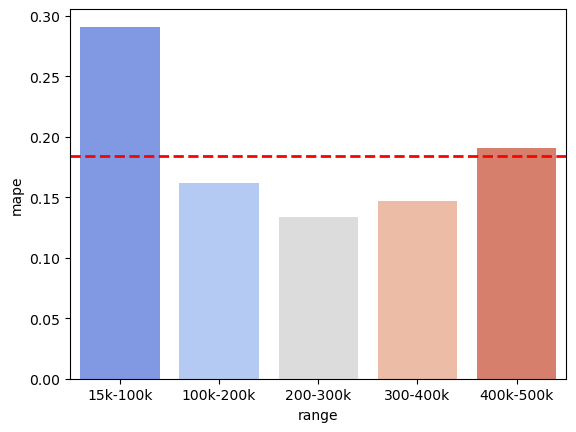

In [106]:
ax = sns.barplot(data=data,x='range',y='mape',
            palette='coolwarm',
            estimator='mean',
            errorbar=None
            )
# Add a horizontal line at y=10
ax.axhline(0.184, color='red', linewidth=2, linestyle='--')

# 12. Summary

## Cost Evaluation

**Let's assume** that a real estate company uses the model to predict house prices and decides to price their properties based on the model's predictions.

- **Number of Properties Sold Annually:** 500
- **Average Increase in Selling Price per Property:** $10,000 (due to **better pricing strategy**)

**Revenue Impact:**
- **Increased Annual Revenue:** 500 x $10,000 = $5,000,000

**Cost Savings:**
- **Reduction in Overhead Costs:** If the model helps to streamline operations and reduce marketing costs by 10% (less marketing effort due to **better pricing strategy** = the **price helps market itself** intuitively), and the annual marketing budget is $1,000,000.
- **Annual Savings:** \( 0.10 \times \$1,000,000 = \$100,000 \)

**Total Annual Financial Impact:**
- **Total Benefit:** \( \$5,000,000 (Increased Revenue) + \$100,000 (Cost Savings) = \$5,100,000 \)

By using the **ML model** to inform their pricing strategy and operational decisions, the real estate company could potentially see a significant increase in their annual revenue and cost savings. It can even lead to improved pricing strategies, better investment decisions, and more effective policy-making. Which could lead to a **positive ROI** (return on investment).


## Conclusion

* <b>Algorithm: </b>Based on the evaluation of the algorithm results for modeling, it can be concluded that XGBoost Regressor is the best algorithm, but Random Forest regressor has a **MAPE** & **RMSE** score (data analysts **focus on MAE** because of the **data provided tends to have outliers**) which is **almost similar** to XGBoost so it still has potential for us to test tuning, due to the possibility of overfitting in the existing model.
<br>

* <b>Evaluation metrics: </b>It can be seen that after tuning, it turns out that **XGboost is the most appropriate** evaluation metric algorithm seen from the tuning results, although it is not very significant, there is a **visible decrease in MAE**, whereas in **Random forest** it actually there is an increase in error. In the reg plot and scatterplot graphs it can also be seen that although there is still residual data, the nature and pattern produced has formed a linear shape so it can be concluded that the resulting model can predict values ​​that are close to the actual value.

* <b>Feature importance : </b>From the new correlation matrix we can see that the feature that has the most positive influence is **cat_income_cat_Very_Wealthy**</i>** which we can interpret as the median_income of the specific block of house, the price of which will be higher if the occupants has an income in the "Very Wealthy" category (affluent people). The feature that has the most negative influence is **cat_ocean_proximity_INLAND** which means that a house located far from the coast is predicted to have a much lower price (significantly reduced).

* <b>Evaluation Metrics : </b>In the evaluation metrics we can see that the MAPE value generated by the XGboost model after tuning is around 18.4%. Therefore, we can draw the conclusion that data from the 1990 California Census used for training and testing will deviate by approximately 18.4 percent from the actual price.

## Recommendation

1. **Addition of Features:** - As time progresses, cities will also grow and develop to be more advanced. Current home buying trends is likely to increase in terms of features sought after (bigger cities will be able to afford more features) such as facilities, landmarks, malls (shopping centers), etc.
2. **Update data:** - The data provided is too old and therefore can be considered outdated, where income and house selling prices have increased exponentially from inflation for the last 34 years (1990-2024).
3. **Property Categorisation:** a settlement(land) and houses (flats/apartments) is also very important because settlements with high populations are the most likely to already have many flats/apartments. There needs to be a definitive way to consider such properties/assets and the underlying features that help inluence their prices according to their time. 

In [23]:
df_c

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value,income_cat,housingAge_cat
0,-119.79,36.73,52,112,28,193,40,1.9750,INLAND,47500.0,Lower-Middle Class,Prehistoric
1,-122.21,37.77,43,1017,328,836,277,2.2604,NEAR BAY,100000.0,Middle Class,Prehistoric
2,-118.04,33.87,17,2358,396,1387,364,6.2990,<1H OCEAN,285800.0,Very Wealthy,Middle-Aged
3,-118.28,34.06,17,2518,1196,3051,1000,1.7199,<1H OCEAN,175000.0,Lower-Middle Class,Middle-Aged
4,-119.81,36.73,50,772,194,606,167,2.2206,INLAND,59200.0,Middle Class,Prehistoric
...,...,...,...,...,...,...,...,...,...,...,...,...
13057,-121.26,38.27,20,1314,229,712,219,4.4125,INLAND,144600.0,Wealthy,Middle-Aged
13058,-120.89,37.48,27,1118,195,647,209,2.9135,INLAND,159400.0,Middle Class,Old
13059,-121.90,36.58,31,1431,435,704,393,3.1977,NEAR OCEAN,289300.0,Upper-Middle Class,Old
13060,-117.93,33.62,34,2125,498,1052,468,5.6315,<1H OCEAN,484600.0,Very Wealthy,Old


##

##